# 1. Introduction
This is the capstone project of IBM Data Science Professional Certificate. The aim of this project is to leverage the Foursquare location data to explore or compare neighbourhoods or cities to analyse how these data can solve selected problems.

# 2. Problem description
Since the beginning of 2020, all people get panic because of the alarming spreading speed of ‘Covid-19’ pandemic, trigging the biggest global recession. In contrast, the local property market of Canberra, the capital city of Australia, has boomed because of its good performance in fighting with the virus. Both sales price and transaction numbers hit a record high every month since April 2019, attracting more people entering the market and push the price higher correspondingly.

 Almost all the people around are either actively seeking in the property market or talking about the market. In this report, we are trying to help Sandy find a Suburb where she will be most comfortable with and at an acceptable price. Currently, she stays in Dickson 2602 and works at Red Hill 2601. Based on her preference, this report will focus on four areas to analyse the comfortable score: health, education, safety and convenience.

# 3. Data
To find the most promising suburb for Sandy, two main datasets were used for analysis:

a)     House price

b)     Nearby venues


In [199]:
import json
import numpy as np
import pandas as pd 
pd.set_option("display.max_rows", None)
pd.set_option('display.float_format', '{:,.4f}'.format)

#Libraries used to scrap website
import requests
from lxml import html
from bs4 import BeautifulSoup
from selenium import webdriver


from scraper_cbr_suburb import CBR_suburb_scraper
from scraper_realestate_map import RealestateScraper, Get_all_suburbs
from scraper_practises_IO import PractiseScraper
from scraper_hospital import HospitalScraper

#Import functions created
from data_transform import GeojsonModify, Data_transform, Data_transform_Crime
from geojson_modified import Geojson_modified
from neighbour import Neighborhoods

#Library for database connection
import os
import time
from sqlalchemy import create_engine
db_user = os.environ.get("DB_USER")
db_pass = os.environ.get("DB_PASSWORD")
host = "127.0.0.1"
database = "real_estate"
engine = create_engine("mysql+pymysql://{user}:{pw}@{host}/{db}".format(user=db_user, pw=db_pass, host=host, db=database))

#Library for k-mean algoritm
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.stats import zscore


# Libraries for geodate
from geopy.geocoders import Nominatim
import geopy.distance

#Libraries for plots

import seaborn as sns
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import folium
from folium import plugins
from folium.plugins import MarkerCluster
import branca.colormap as bcm
from branca.element import Template, MacroElement
from folium.plugins import DualMap
from folium.plugins import HeatMap




import warnings
warnings.filterwarnings('ignore')

## 3.1 House price
Complete suburbs and districts list were extracted from the official GeoJson data provided by the ACT Government GeoHub API (https://actmapi-actgov.opendata.arcgis.com).

Then these lists will be used as an reference to scrap the corresponding useful data from Wikipedia website by using https://en.wikipedia.org/wiki/Canberra_Central as a starter to redirect to each targeting suburb.

Finally, based on the suburbs list, 30,873 transactions in 108 suburbs listed on the real estate website between 2010 and June 2021 will was scrapped for the analysis, among which, 1,473 transactions in 102 suburbs was in the first half year of 2021.

In [200]:
ACT_District_Boundaries_API ="https://opendata.arcgis.com/datasets/565b5afe76914aeaa3463bd42714a4d6_1.geojson"
ACT_Division_Boundaries_API = "https://opendata.arcgis.com/datasets/619591d62d5f4ed2bf7a217f37969a10_2.geojson"
# division
try: 
    with open("ACT_Division_Boundaries.json") as json_file:
        ACT_Division_Boundaries = json.load(json_file)
except:
    ACT_Division_Boundaries = requests.get(ACT_Division_Boundaries_API).json()
    with open("ACT_Division_Boundaries.json", "w") as json_file:
        json.dump(ACT_Division_Boundaries, json_file)
suburbs_list = [i["properties"]["DIVISION_NAME"].capitalize() for i in ACT_Division_Boundaries["features"]]

# district
try: 
    with open("ACT_District_Boundaries.json") as json_file:
        ACT_District_Boundaries = json.load(json_file)
except:
    ACT_District_Boundaries = requests.get(ACT_District_Boundaries_API).json()
    with open("ACT_District_Boundaries.json", "w") as json_file:
        json.dump(ACT_District_Boundaries, json_file)
districts_list = [i["properties"]["DISTRICT_NAME"].capitalize() for i in ACT_District_Boundaries["features"]]

print(f"There are {len(suburbs_list)} suburbs, and {len(districts_list)} districts in Canberra")

There are 120 suburbs, and 19 districts in Canberra


In [201]:
# use Scraper to scrap suburbs data from wikipedia
try:
    sql_query = """
            SELECT 
                *
            FROM cbr_suburbs
            """
    cbr_suburbs = pd.read_sql(sql_query, con=engine)
except:
    suburb_instance = CBR_suburb_scraper()
    cbr_suburbs = suburb_instance.get_suburbs_details()
print(cbr_suburbs.shape)
cbr_suburbs.head()

(126, 9)


,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url
0,Acton,Canberra Central,"2,086",0,2601,1928,-35.2794,149.1194,"https://en.wikipedia.org/wiki/Acton,_Australia..."
1,Ainslie,Canberra Central,"5,189","1,483",2602,1928,-35.2628,149.1442,"https://en.wikipedia.org/wiki/Ainslie,_Austral..."
2,Braddon,Canberra Central,"5,500","3,930",2612,1922,-35.2719,149.1356,"https://en.wikipedia.org/wiki/Braddon,_Austral..."
3,Campbell,Canberra Central,"4,997",781,2612,1928,-35.2881,149.1539,"https://en.wikipedia.org/wiki/Campbell,_Austra..."
4,City,Canberra Central,"4,276","2,850",2601,1927,-35.2820,149.1286,"https://en.wikipedia.org/wiki/City,_Australian..."


In [202]:
# Prepare for GeoJson Data
try:
    with open("ACT_GEOJSON.json") as json_file:
        geo_map_cbr = json.load(json_file)
except:
    geo = Geojson_modified()
    geo_map_cbr = geo.geojson_modified(ACT_Division_Boundaries, cbr_suburbs)
print(len(geo_map_cbr["features"]))
geo_map_cbr["features"][0]["properties"]

120


{'ID': 644,
 'DIVISION_CODE': 911,
 'DIVISION_NAME': 'COOMBS',
 'LAST_UPDATE_DATE': '2011-09-19T08:51:25Z',
 'OBJECTID': 1,
 'suburb': 'Coombs',
 'district': 'Molonglo Valley',
 'population': '1,811',
 'density/km': '787',
 'postcode': '2611',
 'established': '0',
 'latitude': -35.3189083,
 'longitude': 149.0448194,
 'suburb_url': 'https://en.wikipedia.org/wiki/Coombs,_Australian_Capital_Territory',
 'safety_score': 0.006542049951516106,
 'avg_price': 985361.0,
 'price_range': '(890584.5, 1000397.917]',
 'color': 'orange',
 'Numbe Of Venues Type': 2,
 'preferred_cluster': 5.0,
 'Numbe Of Venues Type ALL': 4,
 'all_cluster': 6.0}

In [203]:
# In order to filter out the mislabelled category, we will only choose the house listed with more than 2 bedrooms which also fit the requirement of sandy
try:
    sql_query = """
            SELECT 
                Id,
                State,
                Suburb as suburb,
                Postcode as postcode,
                Price,
                Datesold
            FROM house_list_map
            WHERE YEAR(Datesold) >= "2010"
                AND Price > 0
                AND Type = "House"
                AND Bedrooms >=2
            """
    cbr_houses_all = pd.read_sql(sql_query, con=engine)

except:
    # Create a index from cbr_suburbs
    suburbs_index = cbr_suburbs["suburb"].str.lower() + ", act " + cbr_suburbs["postcode"]
    # Scrap data based on the surburb_index
    house_list = Get_all_suburbs()
    cbr_houses_all = house_list.get_all_suburbs(suburbs_index)
    cbr_houses_all = cbr_houses_all[["Id", "State", "Suburb", "Postcode", "Price", "Datesold"]][(cbr_houses_all.Datesold >= "1-1-2010")&(cbr_houses_all.Price > 0)&(cbr_houses_all.Type =="House")].reset_index(drop=True)

print(f"There are __{cbr_houses_all.shape[0]}__ transactions in __{cbr_houses_all.suburb.unique().shape[0]}__ suburbs found from 2010 to 2021 ")
cbr_houses_all.head()

There are __30873__ transactions in __108__ suburbs found from 2010 to 2021 


,Id,State,suburb,postcode,Price,Datesold
0,136465418,ACT,Ainslie,2602,1310000,2021-06-23
1,136274558,ACT,Ainslie,2602,1670000,2021-05-28
2,135907850,ACT,Ainslie,2602,1590000,2021-05-21
3,135784170,ACT,Ainslie,2602,1955000,2021-04-10
4,135713178,ACT,Ainslie,2602,1175000,2021-03-31


In [204]:
# get average price of 2021
cbr_houses_2021 = cbr_houses_all[["suburb", "Price","postcode"]][cbr_houses_all.Datesold >= "1-1-2021"]
print(print(f"There are __{cbr_houses_2021.shape[0]}__ transactions in __{cbr_houses_2021.suburb.unique().shape[0]}__ suburbs found in 2021 "))
cbr_houses_2021.head()

There are __1473__ transactions in __102__ suburbs found in 2021 
None


,suburb,Price,postcode
0,Ainslie,1310000,2602
1,Ainslie,1670000,2602
2,Ainslie,1590000,2602
3,Ainslie,1955000,2602
4,Ainslie,1175000,2602


## 3.2 Nearby venues
In this report, the number of hospitals, community services, walk-in centres and general practises will be taken as health index, which will be scrapped from website https://health.act.gov.au/hospitals-and-health-centres and https://www.whitecoat.com.au.

The number of schools will be used as education index and the number of police stations and crimes of each suburbs will be used as safety index. These data will be get from ACT Open Data Portal https://www.data.act.gov.au.

Finally, as the requirement of this project, the Foursquare API will be used to get the nearby venues of each suburb as an index for the convenience.

### 3.2.1 health
### 1)scrapped hospitals data from https://health.act.gov.au/hospitals-and-health-centres

In [205]:
# Load scrapper Getcbhospitals
try:
    sql_query = """
            SELECT 
                *
            FROM cbr_hospitals
            """
    cbr_hospitals = pd.read_sql(sql_query, con=engine)
except:
    cbr_hospitals = HospitalScraper()
    cbr_hospitals = cbr_hospitals.get_hospitals(merge_df="y")
print(f"There are {cbr_hospitals.shape[0]} health services in Canberra")
# cbr_hospitals.head()

There are 20 health services in Canberra


#### 2) Scrap general practise data from https://www.whitecoat.com.au/

In [206]:
#get the surburb index from surburbs data loaded before
try:
    sql_query = """
            SELECT 
                *
            FROM cbr_practise
            """
    cbr_practise = pd.read_sql(sql_query, con=engine)
except:
    cbr_practise = PractiseScraper()
    cbr_practise = cbr_practise.data
print(f"There are {cbr_practise.shape[0]} health services in Canberra")
# cbr_practise.head()

There are 25 health services in Canberra


#### 3) Combined GP data with hospital data

In [207]:
columns =["suburb","postcode", "venue", "address", "venue category", "main category", "venue latitude", "venue longitude"]
cbr_health = cbr_hospitals[columns].append(cbr_practise[columns], ignore_index=True)
print(f"There are {cbr_health.shape[0]} health services in Canberra")
cbr_health.head()

There are 45 health services in Canberra


,suburb,postcode,venue,address,venue category,main category,venue latitude,venue longitude
0,Garran,2605,Canberra Hospital,"Yamba Dr, Garran ACT 2605",Hospitals,Health,-35.3462,149.1014
1,Belconnen,2617,Belconnen Community Health Centre,"Belconnen Community Health Centre, 56 Lathlain...",Community Health Centres,Health,-35.2397,149.0642
2,Gungahlin,2912,Gungahlin Community Health Centre,"57 Ernest Cavanagh St, Gungahlin ACT 2912",Community Health Centres,Health,-35.1842,149.1364
3,Greenway,2900,Tuggeranong Community Health Centre,"Anketell St &, Pitman St, Greenway ACT 2900",Community Health Centres,Health,-35.4210,149.0921
4,Canberra,None,City Community Health Centre,"1 Moore St, Canberra ACT 2601",Community Health Centres,Health,-35.2813,149.1292


### 3.2.2 Education Data
The Education data was get from ACT Open Data Portal https://www.data.act.gov.au/ 

In [208]:
import requests
try:
    sql_query = """
            SELECT 
                *
            FROM cbr_schools
            """
    cbr_schools = pd.read_sql(sql_query, con=engine)
except:
    SCHOOLS_APIS = {
        "Schools_Government_Primary" : "https://opendata.arcgis.com/datasets/972b2618149941ed9cb3be138dfe09ee_0.geojson",
        "Schools_Government_Secondary" : "https://opendata.arcgis.com/datasets/21e609f2c2384b0f97409910af313001_2.geojson",
        "Schools_Government_College" : "https://opendata.arcgis.com/datasets/3f364623214b4b06b694b58b86c69c25_4.geojson",
        "Schools_Other_Government_Schools" :"https://opendata.arcgis.com/datasets/2ba11de68c734252bd93850738d55da4_6.geojson",
        "Schools_Non_Government" : "https://opendata.arcgis.com/datasets/e0eef804aa52478fb97d3abd30b2e609_7.geojson",
        }
    school_list = []
    for api in SCHOOLS_APIS.items():
        try:
            with open(f"{api[0]}.json") as json_file:
                data = json.load(json_file)
                print("try open")
        except:
            data= requests.get(api[1]).json()
            with open(f"{api[0]}.json", "w") as json_file:
                json.dump(data, json_file)
            print("try except")

        school_list.append(
            [{
            "venue":i["properties"]["SCHOOL_NAME"],
            "government":i["properties"]["GOVERNMENT"],
            "venue category":i["properties"]["TYPE"],
            "address":i["properties"]["STREET"],
            "suburb":i["properties"]["SUBURB"].capitalize(),
            "state":i["properties"]["STATE"],
            "postcode":i["properties"]["POSTCODE"],
            "level":i["properties"]["LEVEL_"],
            "status":i["properties"]["STATUS"],
            "venue latitude":i["geometry"]["coordinates"][1],
            "venue longitude":i["geometry"]["coordinates"][0],
            "main category": "Education"

            } for i in data["features"]]
        )
    cbr_schools = pd.DataFrame([i for i in school_list for i in i])
    try:   
        cbr_schools.to_sql('cbr_schools', engine, index=False)
    except:
        engine.execute("DROP TABLE cbr_schools")
        cbr_schools.to_sql('cbr_schools', engine, index=False)
print(f"There are {cbr_schools.shape[0]} schools in Canberra")
# cbr_schools.head()

There are 153 schools in Canberra


### 3.2.3 Safety Data
We will use the crime number as a index of safety in the project, and the data was get from ACT Open Data Portal https://www.data.act.gov.au/   

In [209]:
try:
    sql_query = """
            SELECT 
                *
            FROM cbr_police
            """
    cbr_police = pd.read_sql(sql_query, con=engine)

except:
    cbr_police_station_url = "https://www.data.act.gov.au/resource/t6hf-u79n.json"
    cbr_police_station = pd.read_json(cbr_police_station_url)
    cbr_police = pd.DataFrame([{
        "venue" : i[1].split("(")[-1].replace(")", ""),
        "venue latitude" : i[2]["latitude"],
        "venue longitude" : i[2]["longitude"],
        "address": json.loads(i[2]["human_address"])["address"],
        "postcode": json.loads(i[2]["human_address"])["address"].split()[-1],
        "state":json.loads(i[2]["human_address"])["address"].split()[-2],
        "suburb":json.loads(i[2]["human_address"])["address"].split()[-3].capitalize(),
        } for i in cbr_police_station.itertuples()])
    cbr_police["venue category"] = "Police Station"
    cbr_police["main category"] = "Safety"
    try:   
        cbr_police.to_sql('cbr_police', engine, index=False)
    except:
        engine.execute("DROP TABLE cbr_police")
        cbr_police.to_sql('cbr_police', engine, index=False)

print(f"There are {cbr_police.shape[0]} police stations in Canberra")
# cbr_police.head(10)

There are 6 police stations in Canberra


In [210]:
# get the crime index data
try:
    cbr_crime = pd.read("cbr_crime.json")
except:
    cbr_crime_api = "https://www.data.act.gov.au/download/2egm-dieb/application%2Fvnd.openxmlformats-officedocument.spreadsheetml.sheet"
    cbr_crime = pd.read_excel(cbr_crime_api, skiprows=5)
    cbr_crime.to_json("cbr_crime.json")
print(cbr_crime.shape)
cbr_crime.head()

(230, 528)


,Unnamed: 0,1 Homicide,2a Assault -,2b Assault -,3 Sexual Assault,4 Other offences,5a Robbery -,5b Robbery -,6a Burglary dwellings,6b Burglary shops,...,4 Other offences.27,5a Robbery -.27,5b Robbery -.27,6a Burglary dwellings.27,6b Burglary shops.27,6c Burglary other.27,7 Motor vehicle.27,8 Property damage.27,9 Other offences.27,92 Theft (excluding.27
0,NaN,NaN,FV,Non-FV,NaN,against a person,armed,other,NaN,NaN,...,against a person,armed,other,NaN,NaN,NaN,theft,NaN,NaN,Motor Vehicles)
1,ARANDA,0,0,0,0,0,0,0,1,0,...,0,0,0,3,2,0,1,8,39,6
2,BELCONNEN,0,2,24,8,3,0,1,13,1,...,4,1,3,10,7,3,17,62,142,113
3,BRUCE,0,1,1,1,1,0,0,3,0,...,0,0,0,1,3,6,2,19,33,21
4,CHARNWOOD,0,2,2,1,0,1,0,1,0,...,0,0,0,1,0,1,2,11,34,6


In [211]:
# define a class Data_transform_Crime to clean and transform crime excel
crime = Data_transform_Crime()
cbr_safety = crime.transform_crime_data(cbr_crime, groupby="index", score="safety_score")
print(cbr_safety.shape)
cbr_safety.head()

(123, 22)


,suburb,1 Homicide,2a Assault,2b Assault,3 Sexual Assault,4 Other offences,5a Robbery,5b Robbery,6a Burglary dwellings,6b Burglary shops,...,8 Property damage,9 Other offences,91a TINs Speeding,91b TINs Mobile,91c TINs Seatbelts,91d TINs Other,92 Theft (excluding,93 CINs,safety_score_total,safety_score
0,Black mountain,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0833
1,Kinlyside,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.1786,0.0714,0.0000,0.0000,0.1071,0.0000,0.0000,0.3571,0.0649
2,Harman,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0714,1.1071,0.0000,0.0000,0.8929,0.0714,0.0000,2.1429,0.0328
3,Williamsdale,0.0000,0.0000,0.0714,0.0000,0.0000,0.0000,0.0000,0.0357,0.0000,...,0.2143,0.6429,1.0357,0.1071,0.0000,1.1071,0.4643,0.0000,3.7857,0.0285
4,Uriarra,0.0000,0.0000,0.0714,0.0000,0.0000,0.0357,0.0000,0.0000,0.0000,...,0.3571,1.1071,0.1429,0.0357,0.0000,2.3571,0.2143,0.0000,4.4643,0.0270


In [212]:
#combine safety score
cbr_merged = cbr_suburbs.copy()
cbr_merged = cbr_merged.merge(cbr_safety[["suburb","safety_score"]], how="left", on="suburb")
print(cbr_merged.shape)
cbr_merged.head()

(126, 10)


,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score
0,Acton,Canberra Central,"2,086",0,2601,1928,-35.2794,149.1194,"https://en.wikipedia.org/wiki/Acton,_Australia...",0.0013
1,Ainslie,Canberra Central,"5,189","1,483",2602,1928,-35.2628,149.1442,"https://en.wikipedia.org/wiki/Ainslie,_Austral...",0.0020
2,Braddon,Canberra Central,"5,500","3,930",2612,1922,-35.2719,149.1356,"https://en.wikipedia.org/wiki/Braddon,_Austral...",0.0005
3,Campbell,Canberra Central,"4,997",781,2612,1928,-35.2881,149.1539,"https://en.wikipedia.org/wiki/Campbell,_Austra...",0.0043
4,City,Canberra Central,"4,276","2,850",2601,1927,-35.2820,149.1286,"https://en.wikipedia.org/wiki/City,_Australian...",0.0000


### 3.2.4 Convenience Data
The Foursquare API will be used to explore nearby venues as a index for convenience.

In [213]:
# The FourSqure information was set as follows:
CLIENT_ID = os.environ.get("F_CLIENT_ID")
CLIENT_SECRET = os.environ.get("F_CLIENT_SECRET")
VERSION = "20210620"
LIMIT = 200        # limit of number of venues returned by Foursquare API
RADIUS = 1000       # within a radius of 1000 meters

In [214]:
# get the function created for foursqure
address = "Canberra, Australia"
neighbour = Neighborhoods(address, cbr_suburbs)     #create a instance to get the neighbour data

In [215]:
version="20210620"
try:
    sql_query = f"""
            SELECT 
                *
            FROM nearby_venues_{version}
            """
    cbr_venues = pd.read_sql(sql_query, con=engine)
except:
    cbr_venues = neighbour.getNearbyVenues("suburb", limit =200, latitude="latitude", longitude="longitude", radius = 1000, version="20210620")
print(f"There are {cbr_venues.shape[0]} different venue in Canberra.")
# cbr_venues.head()

There are 1696 different venue in Canberra.


### 3.3 get the latitude and longitude of Sandy's current home address and work place
The Geocoder Python package (https://geocoder.readthedocs.io/index.html) is used to get the coordinates (latitude and longitude) for Sandy's house. And it was included in the class defined Negibour

In [216]:
# Home Address
home_address = 'Dickson 2602, ACT'
home_latlon = Neighborhoods(home_address).LatLon
print('The geograpical coordinate of Sandy current home address, Dickson 2602, ACT are {:.4f}, {:.4f}.'.format(home_latlon[0], home_latlon[1]))
work_address = "Red Hill 2603, ACT"
work_latlon = Neighborhoods(work_address).LatLon
print('The geograpical coordinate of Sandy current work place, civic 2601, ACT are {:.4f}, {:.4f}.'.format(work_latlon[0], work_latlon[1]))

The geograpical coordinate of Sandy current home address, Dickson 2602, ACT are -35.2492, 149.1380.
The geograpical coordinate of Sandy current work place, civic 2601, ACT are -35.3295, 149.1217.


## 4 Methodology and Analysis
### 4.1 House price
First thing first, exploratory data analysis will be used to analyse the house price of Canberra.

### a) Average house price

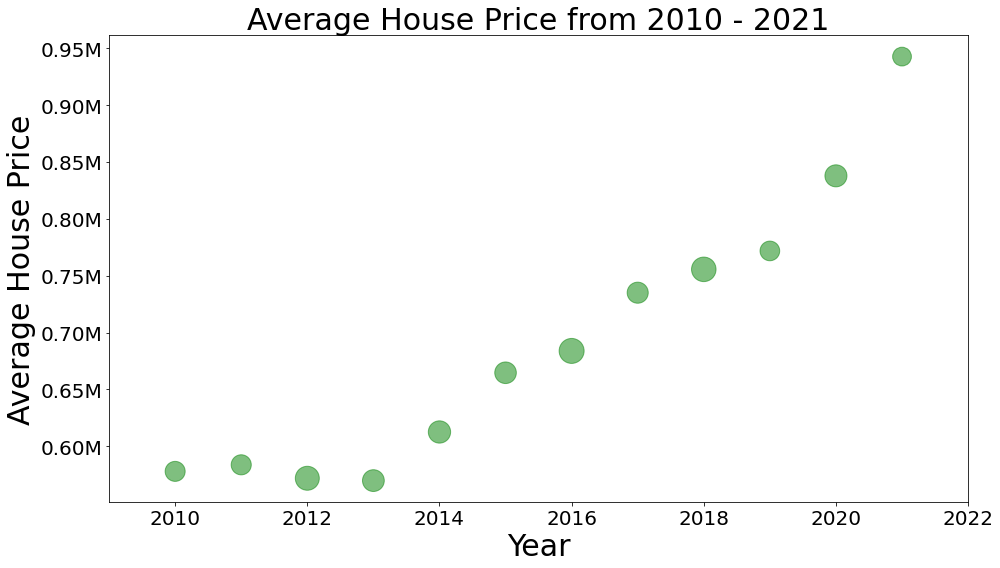

In [217]:
# plot the trend
scatterplot_df = cbr_houses_all[["Datesold","Price","suburb"]].groupby(["suburb", cbr_houses_all.Datesold.dt.year]).mean().reset_index().rename(columns={"Datesold":"Year"})
scatterplot_df_year = cbr_houses_all[["Datesold","Price","suburb"]].groupby(cbr_houses_all.Datesold.dt.year).mean().reset_index().rename(columns={"Datesold":"Year"})
for x in scatterplot_df_year.itertuples():
    # print(x)
    avg = scatterplot_df[scatterplot_df.Year == x[1]].Price.mean()
    maxx = scatterplot_df[scatterplot_df.Year == x[1]].max()[2]
    minx = scatterplot_df[scatterplot_df.Year == x[1]].min()[2]
    scatterplot_df_year.loc[x[0], "Norm"] = ((avg - minx)/(maxx-minx))*2000+10
    # print(avg)
    # print(maxx)
    # print(minx)

scatterplot = scatterplot_df_year.plot(kind='scatter',
                    x='Year',
                    y='Price',
                    figsize=(14, 8),
                    alpha=0.5,                 
                    color='green',
                    s=scatterplot_df_year.Norm,  
                    xlim=(2009, 2022)
                   )
ylabels = ['{:,.2f}'.format(y) + 'M' for y in scatterplot.get_yticks()/1000000]
xlabels = ['{:4.0f}'.format(y) for y in scatterplot.get_xticks()]
scatterplot.set_yticklabels(ylabels, fontsize=20)
scatterplot.set_xticklabels(xlabels, fontsize=20)
# scatterplot.set_tight_layout(pad=2.2, h_pad=None, w_pad=None, rect=None)
scatterplot.set_title("Average House Price from 2010 - 2021",fontsize=30, fontname="Times New Roman Bold")
scatterplot.set_ylabel("Average House Price", fontsize=30, fontname="Times New Roman Bold")
scatterplot.set_xlabel("Year", fontsize=30, fontname="Times New Roman Bold")
plt.grid(False)
plt.tight_layout()
plt.savefig("scatter.jpg");

In [218]:
# numberic view of house price in 2021
print(cbr_houses_2021.describe())
print("Skewness: {:.4f}".format(cbr_houses_2021['Price'].skew()))
print("Kurtosis: {:.4f}".format(cbr_houses_2021['Price'].kurt()))

               Price
count     1,473.0000
mean    942,761.1215
std     373,044.8283
min     315,000.0000
25%     717,000.0000
50%     850,000.0000
75%   1,090,000.0000
max   4,375,000.0000
Skewness: 2.5091
Kurtosis: 12.2976


In [300]:
# prepare data for visualization
data_for_map = cbr_houses_all[["suburb","Price","Datesold"]]
data_for_map["Year"] = data_for_map.Datesold.dt.year.astype(str)
data_for_map = data_for_map[["suburb", "Price", "Year"]]
columns=["suburb","2010","2011","2012", "2013", "2014", "2015", "2016","2017","2018", "2019", "2020", "2021"]
dual_map_price = pd.DataFrame(columns=columns)
dual_map_count = pd.DataFrame(columns=columns)
for i in data_for_map.suburb.unique():
    df = data_for_map[data_for_map.suburb==i]
    df_price = df.groupby("Year").mean().T
    df_price["suburb"] = i
    columns = [df_price.columns[-1]] + list(df_price.columns[:-1])
    df_price = df_price[columns]
    dual_map_price = dual_map_price.append(df_price, ignore_index=True)

    df_quantity= df.groupby("Year").count().T
    df_quantity["suburb"] = i
    columns = [df_quantity.columns[-1]] + list(df_quantity.columns[:-1])
    df_quantity = df_quantity[columns]
    df_quantity = df_quantity.drop_duplicates(subset=["suburb"])
    dual_map_count = dual_map_count.append(df_quantity, ignore_index=True)
    # print(df.head())
dual_map_price = dual_map_price.fillna(0)
dual_map_count = dual_map_count.fillna(0)
# prepare year list
year_list = list(cbr_houses_all.Datesold.dt.year.unique())
year_list.sort()
year_list

[2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]

In [222]:
colormap = bcm.linear.YlOrRd_09.scale(0, 1500000)
for i in year_list:
    df = dual_map_price[["suburb", str(i)]].rename(columns={str(i): "Price"})
    for j in suburbs_list:
        if j in list(df.suburb):
            continue
        else: 
            df = df.append(pd.DataFrame([{"suburb": j, "Price": 0}]))
    df = df.reset_index(drop=True)
    m_i = folium.Map(width=500, height=500,
               location=[-35.40, 149.1380], 
               zoom_start=10,
               zoom_control=False,
               tiles='cartodbpositron')
    # Add year label to the map
    title_html = '''
                 <h3 align="left" style="font-size:22px"><b>{}</b></h3>
                 '''.format('Year: ' + str(i))   
    m_i.get_root().html.add_child(folium.Element(title_html))
    
    folium.GeoJson(
        ACT_Division_Boundaries,
        style_function=lambda feature: {
            'fillColor': colormap(df[df.suburb==feature["properties"]["DIVISION_NAME"].capitalize()].Price.values[0]),
            'fillOpacity': 0.6, 
            'color': 'darkred',
            'weight': 0.5,
            'lineColor': 'white',
            'stroke' : False
        } 
    ).add_to(m_i)
    # m_i.save('GifMap/house_price_' + str(i) + '.html')
m_i

In [223]:
colormap_price = bcm.linear.YlOrRd_09.scale(0, 1500000)
colormap_count = bcm.linear.YlOrRd_09.scale(0, 100)

for i in year_list:
    df_price = dual_map_price[["suburb", str(i)]].rename(columns={str(i): "Price"})
    df_count = dual_map_count[["suburb", str(i)]].rename(columns={str(i): "Quantity"})
    for j in suburbs_list:
        if j in list(df_price.suburb):
            continue
        else: 
            df_price = df_price.append(pd.DataFrame([{"suburb": j, "Price": 0}]))
            df_count = df_count.append(pd.DataFrame([{"suburb": j, "Quantity": 0}]))

    df_price = df_price.reset_index(drop=True)
    avg_price = df_price.Price.mean()
    # print(df_price)
    df_count = df_count.reset_index(drop=True)
    df_count = df_count.merge(cbr_merged[["suburb","latitude","longitude"]], how="left", on="suburb")[["latitude", "longitude","Quantity"]].dropna()

    duapmap = DualMap(
               location=[-35.35, 149.05], 
               zoom_start=11,
               zoom_control=False,
               tiles='cartodbpositron'
               )
               
    # Add year label to the map
    title_html = '''
                 <h3 align="left" style="font-size:22px"><b> Year: {}  Average House Price: $ {:,.2f}</b></h3>
                 '''.format(str(i), avg_price)   
    duapmap.get_root().html.add_child(folium.Element(title_html))
   
    folium.GeoJson(
        ACT_Division_Boundaries,
        style_function=lambda feature: {
            'fillColor': colormap_price(df_price[df_price.suburb==feature["properties"]["DIVISION_NAME"].capitalize()].Price.values[0]),
            'fillOpacity': 0.6, 
            'color': 'darkred',
            'weight': 0.5,
            'lineColor': 'white',
            'stroke' : False
        },
           name="left"
    ).add_to(duapmap.m1)

    HeatMap(df_count,  radius=15, max_opacity=0.8, gradient = {0.2: 'white', 
                            0.5: 'yellow', 
                            1: 'red'}).add_to(duapmap.m2)


    with open("template.html", "r") as file:
        template_dual = file.read()
    macro = MacroElement()
    macro._template = Template(template_dual)

    duapmap.get_root().add_child(macro)
    duapmap.save('dual/house_price_dual_' + str(i) + '.html')
# duapmap

In [226]:
duapmap

In [227]:
# remove outliers of each suburb based on IQR 
cbr_houses_2021_IQR = pd.DataFrame(columns=cbr_houses_2021.columns)
df_outliers_IQR = pd.DataFrame(columns=cbr_houses_2021.columns)
count_outliers = 0

for i in cbr_houses_2021.suburb.unique():
    df = cbr_houses_2021[cbr_houses_2021.suburb==i]
    
    q25, q75 = np.percentile(df.Price, 25), np.percentile(df.Price, 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off
    filtered_remove = [True if x < lower or x > upper else False for x in df.Price]
    filtered_remain = [False if x < lower or x > upper else True for x in df.Price]

    cbr_houses_2021_IQR = cbr_houses_2021_IQR.append(df[filtered_remain], ignore_index=True)
    df_outliers_IQR = df_outliers_IQR.append(df[filtered_remove])
    outliers = [x for x in df.Price if x < lower or x > upper]
    cbr_houses_2021_IQR.Price = cbr_houses_2021_IQR.Price.astype(int)
    if len(outliers) > 0:
    #     print(f" __{i}__\nBased on IQR method, the lower limit is __{lower}__, and the upper limit is __{upper}__ \nthe IQR is __{iqr}__ \n**{len(outliers)}/{df.shape[0]}** outliers are identified \n outliers: {outliers}\n")
        count_outliers += len(outliers)
print(f"Based on IQR method\nafter remove {count_outliers} outliers identified\nThere are {cbr_houses_2021_IQR.shape[0]} transactions in 2021\n")

Based on IQR method
after remove 72 outliers identified
There are 1401 transactions in 2021



The average price is: $ 1,044,418.68



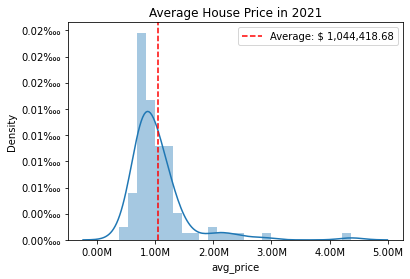

In [228]:
# get average price of 2021
cbr_houses_avg = cbr_houses_2021_IQR[["suburb", "Price"]].groupby("suburb").mean().reset_index().rename(columns={"Price": "avg_price"})
print("The average price is: $ {:,.2f}\n".format(cbr_houses_avg.avg_price.mean()))
#histogram
dis_avg = sns.distplot(cbr_houses_avg['avg_price'])
xlabels = ['{:,.2f}'.format(x) + 'M' for x in dis_avg.get_xticks()/1000000]
dis_avg.set_xticklabels(xlabels)
ylabels = ['{:,.2f}'.format(x) + '‱' for x in dis_avg.get_yticks()*10000]
dis_avg.set_yticklabels(ylabels)
# dis_avg.set_facecolor("white")
dis_avg.set_title("Average House Price in 2021");
plt.axvline(cbr_houses_avg.avg_price.mean(), color="red", linestyle="--",
                linewidth=1.5, label='Average: $ {:,.2f}'.format(cbr_houses_avg.avg_price.mean()))
plt.grid(False)
plt.legend(loc=0);

In [230]:
# write data into main datafrme
cbr_houses_avg.suburb = cbr_houses_avg.suburb.str.capitalize()
cbr_merged = cbr_merged.merge(cbr_houses_avg, how="left", on="suburb")
cbr_merged = cbr_merged.fillna(0)

There are 2 suburb outliers idenfied :
[('Forrest', 2870000.0), ("O'malley", 4375000.0)]

The average price is: $ 992,857.05



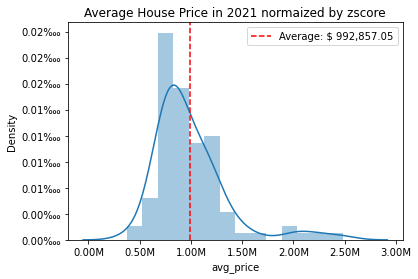

In [231]:
# Calculate the average price by remove the outliers from the suburb by using zscore
filtered_z_scores = zscore(cbr_houses_avg.avg_price) > 3
cbr_houses_avg_zscore = cbr_houses_avg[filtered_z_scores==False]
suburbs_filter_zscore = cbr_houses_avg[filtered_z_scores].reset_index(drop=True)
print(f"There are {suburbs_filter_zscore.shape[0]} suburb outliers idenfied :\n{[x for x in zip(suburbs_filter_zscore.suburb, suburbs_filter_zscore.avg_price)]}\n")
avg_price_zscore = cbr_houses_avg_zscore.avg_price.mean()
print("The average price is: $ {:,.2f}\n".format(avg_price_zscore))

dis_avg = sns.distplot(cbr_houses_avg_zscore['avg_price'])
xlabels = ['{:,.2f}'.format(x) + 'M' for x in dis_avg.get_xticks()/1000000]
dis_avg.set_xticklabels(xlabels)
ylabels = ['{:,.2f}'.format(x) + '‱' for x in dis_avg.get_yticks()*10000]
dis_avg.set_yticklabels(ylabels)

dis_avg.set_title("Average House Price in 2021 normaized by zscore")
plt.axvline(avg_price_zscore, color="red", linestyle="--",
                linewidth=1.5, label='Average: $ {:,.2f}'.format(avg_price_zscore))
plt.grid(False)
plt.legend(loc=0);

There are 7 suburb outliers idenfied :
[('Campbell', 2030000.0), ('Deakin', 2488571.4285714286), ('Forrest', 2870000.0), ('Griffith', 2303333.3333333335), ("O'malley", 4375000.0), ('Red hill', 2162500.0), ('Yarralumla', 1996000.0)]

The average price is: $ 929,529.48


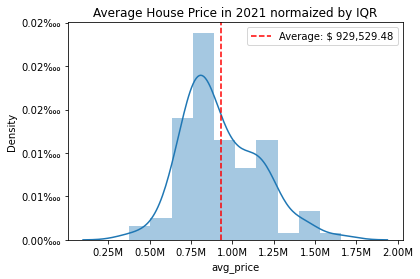

In [232]:
# Calculate the average price by remove the outliers from the suburb by using IQR
q25, q75 = np.percentile(cbr_houses_avg.avg_price, 25), np.percentile(cbr_houses_avg.avg_price, 75)
iqr = q75 - q25
cut_off = iqr * 1.5
lower, upper = q25 - cut_off, q75 + cut_off
filtered_remove = [True if x < lower or x > upper else False for x in cbr_houses_avg.avg_price]
filtered_remain = [False if x < lower or x > upper else True for x in cbr_houses_avg.avg_price]
suburbs_filter_iqr = cbr_houses_avg[filtered_remove]
cbr_houses_avg_iqr = cbr_houses_avg[filtered_remain]
print(f"There are {suburbs_filter_iqr.shape[0]} suburb outliers idenfied :\n{[x for x in zip(suburbs_filter_iqr.suburb, suburbs_filter_iqr.avg_price)]}\n")
avg_price_iqr = cbr_houses_avg_iqr.avg_price.mean()
print("The average price is: $ {:,.2f}".format(avg_price_iqr))

dis_avg = sns.distplot(cbr_houses_avg_iqr['avg_price'])
xlabels = ['{:,.2f}'.format(x) + 'M' for x in dis_avg.get_xticks()/1000000]
dis_avg.set_xticklabels(xlabels)
ylabels = ['{:,.2f}'.format(x) + '‱' for x in dis_avg.get_yticks()*10000]
dis_avg.set_yticklabels(ylabels)
dis_avg.set_title("Average House Price in 2021 normaized by IQR")
plt.axvline(avg_price_iqr, color="red", linestyle="--",
                linewidth=1.5, label='Average: $ {:,.2f}'.format(avg_price_iqr))
plt.grid(False)
plt.legend(loc=0);

Two methods was used to identif and remove the outliers in this porject.  
Based on Zscore method, two out of 102 outliers was identified and the final average price for all the suburbs is [$ 992,857.05].  
Based on the IQR method, 7 out of 102 outliers was identified and the final average price for all the suburbs is [$ 929,529.47].  
We will choose the average of these two price as a reference in this report which is [$ 961,193.27].  

The average price for Dickson is: $ 1,051,250.00
The overall average price is: $ 961,193.27


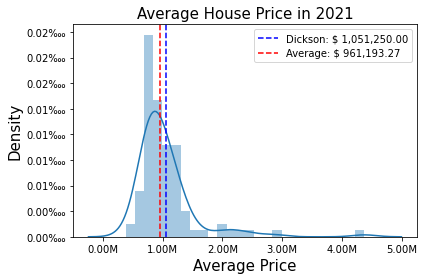

In [233]:
# get average house price of dickson and combined with all the rest suburbs and average house price
dickson_avg_price = cbr_houses_avg_zscore[cbr_houses_avg_zscore.suburb=="Dickson"]["avg_price"].values[0]
average_price_overall = (avg_price_iqr + avg_price_zscore)/2
print("The average price for Dickson is: $ {:,.2f}".format(dickson_avg_price))
print("The overall average price is: $ {:,.2f}".format(average_price_overall))
dis_avg = sns.distplot(cbr_houses_avg['avg_price'])
xlabels = ['{:,.2f}'.format(x) + 'M' for x in dis_avg.get_xticks()/1000000]
dis_avg.set_xticklabels(xlabels)
ylabels = ['{:,.2f}'.format(x) + '‱' for x in dis_avg.get_yticks()*10000]
dis_avg.set_yticklabels(ylabels)

dis_avg.set_title("Average House Price in 2021",fontsize=15, fontname="Times New Roman Bold")
dis_avg.set_ylabel("Density", fontsize=15, fontname="Times New Roman Bold")
dis_avg.set_xlabel("Average Price", fontsize=15, fontname="Times New Roman Bold")


# dis_avg.set_facecolor("white")
plt.axvline(dickson_avg_price, color="blue", linestyle="--",
                linewidth=1.5, label='Dickson: $ {:,.2f}'.format(dickson_avg_price))
plt.axvline(average_price_overall, color="red", linestyle="--",
                linewidth=1.5, label='Average: $ {:,.2f}'.format(average_price_overall))


plt.grid(False)
plt.legend(loc=0)
plt.tight_layout()
plt.savefig("dickson.jpg");

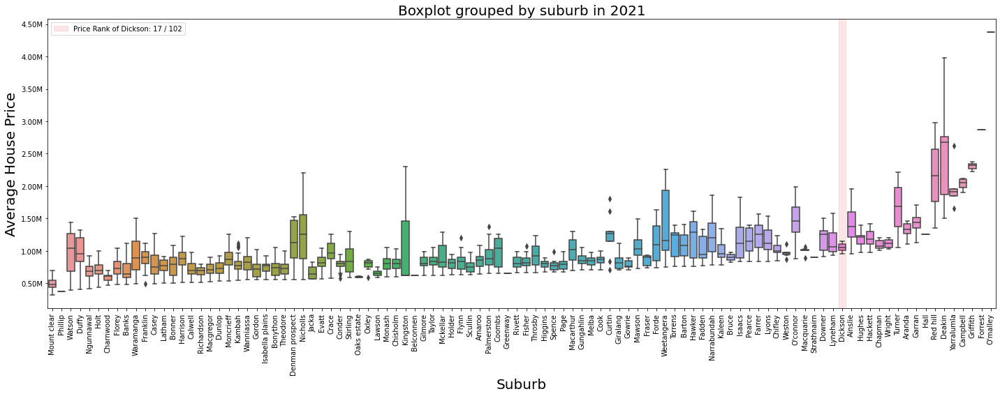

In [234]:
plot_df =cbr_houses_2021_IQR.sort_values("Price")
f, boxplot = plt.subplots(figsize=(20, 8))

boxplot = sns.boxplot(y='Price', x='suburb', data=plot_df)
labels = [item.get_text() for item in boxplot.get_xticklabels()]
position = labels.index("Dickson")
boxplot.axvspan(position-0.4, position+0.4, color='red', alpha=0.1, label=f"Price Rank of Dickson: {len(labels)-position} / {len(labels)}")
plt.legend(loc=0)

ylabels = ['{:,.2f}'.format(y) + 'M' for y in boxplot.get_yticks()/1000000]
boxplot.set_yticklabels(ylabels)
boxplot.set_xticklabels(boxplot.get_xticklabels(), rotation=90)
boxplot.set_title("Boxplot grouped by suburb in 2021", fontsize=20)
boxplot.set_ylabel("Average House Price", fontsize=20)
boxplot.set_xlabel("Suburb", fontsize=20)
plt.grid(False)
plt.tight_layout()
plt.savefig("boxplot.jpg");

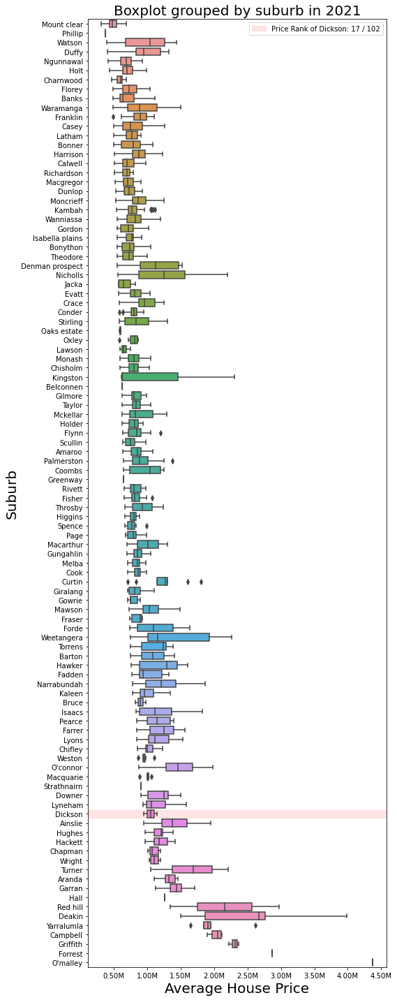

In [235]:
plot_df =cbr_houses_2021_IQR.sort_values("Price")
f, boxplot = plt.subplots(figsize=(8, 20))

boxplot = sns.boxplot(x='Price', y='suburb', data=plot_df, orient="h")
labels = [item.get_text() for item in boxplot.get_yticklabels()]
position = labels.index("Dickson")
boxplot.axhspan(position-0.4, position+0.4, color='red', alpha=0.1, label=f"Price Rank of Dickson: {len(labels)-position} / {len(labels)}")
plt.legend(loc=0)

xlabels = ['{:,.2f}'.format(x) + 'M' for x in boxplot.get_xticks()/1000000]
boxplot.set_xticklabels(xlabels, fontsize=10)
boxplot.set_yticklabels(labels, fontsize=10)

boxplot.set_title("Boxplot grouped by suburb in 2021", fontsize=20)
boxplot.set_xlabel("Average House Price", fontsize=20)
boxplot.set_ylabel("Suburb", fontsize=20)
plt.tight_layout()
plt.savefig("boxplot-h.jpg");

Add color to the data for better visualization

No | House Pirce range             |    color      | # of Surburbs
---|-------------------------------|:-------------:|:--------:
1  | Not_Provided        		   |	gary       | 15
1  | (  376,999.99,   715,834.85]  |	lightblue  | 13
2  | (  715,834.85,   782,445.05]  |    lightgreen | 12
3  | (  782,445.05,   830,298.66]  |	pink       | 12
4  | (  830298.661,   890,584.50]  |	yellow     | 12
5  | (  890,584.50, 1,000,397.91]  |	orange     | 12
6  | (1,000,397.91, 1,147,433.33]  |	red        | 12
7  | (1,147,433.33, 1,280,887.50]  |	darkred    | 12
8  | (1,280,887.50, 4,375,000.00]  |	purple     | 12


In [239]:
### Create the ranges and colors for different pricing as shown in the table above
cbr_merged['price_range'] = pd.qcut(cbr_merged['avg_price'][cbr_merged['avg_price'] != 0], q=8)
cbr_merged['color'] = pd.qcut(cbr_merged['avg_price'][cbr_merged['avg_price'] != 0], q=8, 
                              labels=["lightblue", "lightgreen", "pink", "yellow", "orange",  "red", "darkred", "purple"])

In [240]:
### set the surburbs without price information into gray and value range at 0
cbr_merged['color'] = cbr_merged['color'].cat.add_categories('gray')
cbr_merged['price_range'] = cbr_merged['price_range'].cat.add_categories(0)
cbr_merged.loc[cbr_merged['avg_price']==0,'color']='gray'
cbr_merged.loc[cbr_merged['avg_price']==0,'price_range']=0
cbr_merged.price_range = cbr_merged.price_range.astype(str)
cbr_merged.color = cbr_merged.color.astype(str)
print(cbr_merged.shape)
cbr_merged.head()

(126, 13)


,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score,avg_price,price_range,color
0,Acton,Canberra Central,"2,086",0,2601,1928,-35.2794,149.1194,"https://en.wikipedia.org/wiki/Acton,_Australia...",0.0013,0.0000,0,gray
1,Ainslie,Canberra Central,"5,189","1,483",2602,1928,-35.2628,149.1442,"https://en.wikipedia.org/wiki/Ainslie,_Austral...",0.0020,"1,417,281.2500","(1280887.5, 4375000.0]",purple
2,Braddon,Canberra Central,"5,500","3,930",2612,1922,-35.2719,149.1356,"https://en.wikipedia.org/wiki/Braddon,_Austral...",0.0005,0.0000,0,gray
3,Campbell,Canberra Central,"4,997",781,2612,1928,-35.2881,149.1539,"https://en.wikipedia.org/wiki/Campbell,_Austra...",0.0043,"2,030,000.0000","(1280887.5, 4375000.0]",purple
4,City,Canberra Central,"4,276","2,850",2601,1927,-35.2820,149.1286,"https://en.wikipedia.org/wiki/City,_Australian...",0.0000,0.0000,0,gray


In [241]:
price_range = cbr_merged[["price_range", "color"]].groupby("price_range").count()
price_range

,color
price_range,
"(1000397.917, 1147433.333]",12
"(1147433.333, 1280887.5]",13
"(1280887.5, 4375000.0]",13
"(376999.999, 715834.856]",13
"(715834.856, 782445.055]",13
"(782445.055, 830298.661]",12
"(830298.661, 890584.5]",13
"(890584.5, 1000397.917]",13
0,24


In [242]:
#Update Geojson data
geo = Geojson_modified()
geo_map_cbr = geo.geojson_modified(cbr_merged)
print(len(geo_map_cbr["features"]))
geo_map_cbr["features"][0]["properties"]

try
120


{'ID': 644,
 'DIVISION_CODE': 911,
 'DIVISION_NAME': 'COOMBS',
 'LAST_UPDATE_DATE': '2011-09-19T08:51:25Z',
 'OBJECTID': 1,
 'suburb': 'Coombs',
 'district': 'Molonglo Valley',
 'population': '1,811',
 'density/km': '787',
 'postcode': '2611',
 'established': '0',
 'latitude': -35.3189083,
 'longitude': 149.0448194,
 'suburb_url': 'https://en.wikipedia.org/wiki/Coombs,_Australian_Capital_Territory',
 'safety_score': 0.006542049951516106,
 'avg_price': 985361.0,
 'price_range': '(890584.5, 1000397.917]',
 'color': 'orange'}

In [244]:
housePrice_map = folium.Map(location=[-35.5,149], zoom_start=8, tiles="cartodbpositron")
step = bcm.StepColormap(
    ["gray", "lightblue", "lightgreen", "pink", "yellow", "orange", "purple", "red", "darkred"], vmin=0, vmax=4375000, index=[0, 376999.90, 715834.85, 782445.05, 830298.66, 890584.50, 1000397.91, 1147433.33, 1280887.50, 4375000.00], caption="step"
).add_to(housePrice_map)

folium.GeoJson(
    geo_map_cbr,
    style_function=lambda feature: {
        "fillColor": feature["properties"]["color"],
        "color": "black",
        "weight": 2,
        "dashArray": "5, 5",
    },
    zoom_on_click=True,
    name="Average Price"
).add_to(housePrice_map)

folium.GeoJson(
    ACT_District_Boundaries,
    style_function=lambda feature: {
        "fillColor": "gray",
        "color": "black",
        "weight": 2,
        "dashArray": "5, 5",
    },
    zoom_on_click=True,
    name="Average Price"
).add_to(housePrice_map)



home_popup = "Sandy Home\n Dickson, ACT 2602"
home = folium.Marker(
            location=[home_latlon[0], home_latlon[1]],
            popup=home_popup, 
            tooltip="Sandy Home",
            icon=folium.Icon(icon="home",color="red"),
            name="home"
            ).add_to(housePrice_map)

work_popup = "Sandy workplace\n Civic, ACT 2601"
work = folium.Marker(
            location=[work_latlon[0], work_latlon[1]],
            popup=work_popup, 
            tooltip="Sandy Work",
            icon=folium.Icon(icon="usd",color="red"),
            name="work"
            ).add_to(housePrice_map)

folium.LayerControl(collapsed=False).add_to(housePrice_map)
housePrice_map.save("Map.html")
housePrice_map

In [245]:
# create map
housePrice_map = folium.Map(location=home_latlon, zoom_start=11, tiles="cartodbpositron")

# marker_cluster = plugins.MarkerCluster().add_to(housePrice_map)
#add circles in the colors associated with the defined range
for index, row in cbr_merged.iterrows():
    tooltip = 'suburb: {}, price range: {}'.format(row['suburb'], row['price_range'])
    # label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([row['latitude'], 
                         row['longitude']],
                         tooltip = tooltip,
                        #  popup=label,
                         radius=5, 
                         color=row['color'], 
                         fill=True,
                         fill_color=row['color'],
                         fill_opacity=0.8,
                        #  parse_html=False
                       ).add_to(housePrice_map)

#add an icon at  Sandy home

home_popup = "Sandy Home\n Dickson, ACT 2602"
folium.Marker(
            location=[home_latlon[0], home_latlon[1]],
            popup=home_popup, 
            tooltip="Sandy Home",
            icon=folium.Icon(icon="home",color="red")
            ).add_to(housePrice_map)

work_popup = "Sandy workplace\n Civic, ACT 2601"
folium.Marker(
            location=[work_latlon[0], work_latlon[1]],
            popup=work_popup, 
            tooltip="Sandy Work",
            icon=folium.Icon(icon="usd",color="red")
            ).add_to(housePrice_map)


housePrice_map.save('Map.html')
housePrice_map

## 4.2 Nearby venues  
Two methods will be used to analyse the nearby venues. The first one is to find the most common venues of each suburb and ranks it based on the number of different venue types. The second method is to divide the suburbs into different groups, based on the nearby venues, by using k-mean clustering algorithm.

### colors set for visualization
No: | Categories   |    color      |Quantity of Venues
----|--------------|:-------------:|:----------------:  
1   | Safety       |	Red        | 6  
2   | Health       |    yellow     | 45  
3   | Gym          |	darkblue   | 52  
4   | Pakr         |	cadetblue  | 61  
5   | Pub & Bar    |	blue       | 80  
6   | Education    |	orange     | 153  
7   | Grocery Shop |	lightblue  | 186  
8   | Café         |	green      | 273  
9   | Restaurant   |	lightgreen | 324  
10  | Others       |	white      | 720  


In [303]:
columns = ["suburb","postcode", "venue","venue latitude", "venue longitude", "venue category", "main category"]
all_venues_merged = pd.DataFrame(columns = columns)

columns_table = ["venues", "categories"]
df_venue_summary = pd.DataFrame(columns = columns_table)

concat_list = [
        cbr_venues,
        cbr_health,
        cbr_schools,
        cbr_police
]
for i in concat_list:
    all_venues_merged = all_venues_merged.append(i[columns], ignore_index=True)
    df_venue_summary = df_venue_summary.append(pd.DataFrame([[i.shape[0], i['venue category'].unique().shape[0]]],columns = columns_table), ignore_index=True)

    # print(i.shape[0], i['venue category'].unique().shape[0])
df_venue_summary["type"] = ["Convenience", "Health", "Education", "Safety"]
df_venue_summary = df_venue_summary[["type", "venues", "categories"]]

print(f"There are {all_venues_merged.shape[0]} venues in total\nConvenience: {cbr_venues.shape[0]} venues with {cbr_venues['venue category'].unique().shape[0]} unique categories \nHealth: {cbr_health.shape[0]} venues with {cbr_health['venue category'].unique().shape[0]} unique categories \nEducation: {cbr_schools.shape[0]} venues with {cbr_police['venue category'].unique().shape[0]} unique categories \nSafety: {cbr_police.shape[0]} venues with {cbr_police['venue category'].unique().shape[0]} unique categories ")
df_venue_summary

There are 1900 venues in total
Convenience: 1696 venues with 224 unique categories 
Health: 45 venues with 4 unique categories 
Education: 153 venues with 1 unique categories 
Safety: 6 venues with 1 unique categories 


,suburb,postcode,venue,venue latitude,venue longitude,venue category,main category
0,Acton,2601,Llewellyn Hall,-35.2806,149.1234,Concert Hall,Convenience
1,Acton,2601,Group Seven Espresso,-35.2819,149.1246,Coffee Shop,Convenience
2,Acton,2601,Two Before Ten,-35.2798,149.1262,Café,Convenience
3,Acton,2601,Harvest,-35.2782,149.1267,Coffee Shop,Convenience
4,Acton,2601,The Cupping Room,-35.2805,149.1261,Coffee Shop,Convenience


In [249]:
#prepare data and replace the mislabelled suburbs
#get whole list of suburbs
suburb_list_df = cbr_merged[["suburb","postcode"]]
#check for the incorrect suburb name
suburb_list_check = pd.DataFrame(all_venues_merged.suburb.unique(),columns=["suburb"]).merge(suburb_list_df, how="left", on="suburb")
mislabelled_suburbs = list(suburb_list_check[suburb_list_check.postcode.isnull()].suburb)
print(f"There are {len(mislabelled_suburbs)} types mislabelled\n{' | '.join(mislabelled_suburbs)}")

There are 4 types mislabelled
Canberra | Tuggeranong | Canberra City | Kippax


In [250]:
# Modified the mislabelled suburbs
for row in all_venues_merged.itertuples():
    # print(row[1]=="Kippax")
    if any(cat in row[1] for cat in["Canberra City", "Canberra"]):
        all_venues_merged.loc[row[0], "suburb"] = "City"
    elif row[1] == "Kippax":
        all_venues_merged.loc[row[0], "suburb"] = "Holt"
    elif row[1] == "Tuggeranong":
        all_venues_merged.loc[row[0], "suburb"] = "Greenway"

In [251]:
cbr_venues_modiCat = all_venues_merged.copy()
for i in cbr_venues_modiCat["main category"].unique():
    df = cbr_venues_modiCat[cbr_venues_modiCat["main category"] ==i]

    if i =="Convenience":
        for row in df.itertuples():
            if any(cat in row[6] for cat in["Grocery Store", "Shopping Plaza", "Shopping Mall", "Supermarket", "Market"]):
                cbr_venues_modiCat.loc[row[0], "color"] = "lightblue"
                cbr_venues_modiCat.loc[row[0], "ModCat"] = "Grocery Store"

            elif "Gym" in row[6]:
                cbr_venues_modiCat.loc[row[0], "color"] = "darkblue"
                cbr_venues_modiCat.loc[row[0], "ModCat"] = "Gym"

            elif any(cat in row[6] for cat in["Park", "Playground", "Garden", "Nature Preserve"]):
                cbr_venues_modiCat.loc[row[0], "color"] = "cadetblue"
                cbr_venues_modiCat.loc[row[0], "ModCat"] = "Park"

            elif any(cat in row[6] for cat in["Pub", "Bar", "Lounge", "Bistro"]):
                cbr_venues_modiCat.loc[row[0], "color"] = "blue"
                cbr_venues_modiCat.loc[row[0], "ModCat"] = "Pub&Bar"

            elif any(cat in row[6] for cat in["Café", "Coffee", "Bakery"]):
                cbr_venues_modiCat.loc[row[0], "color"] = "green"
                cbr_venues_modiCat.loc[row[0], "ModCat"] = "Café"

            elif any(cat in row[6] for cat in["Restaurant", "Food"]):
                cbr_venues_modiCat.loc[row[0], "color"] = "lightgreen"
                cbr_venues_modiCat.loc[row[0], "ModCat"] = "Restaurant"

            else:
                cbr_venues_modiCat.loc[row[0], "color"] = "white"   
                cbr_venues_modiCat.loc[row[0], "ModCat"] = "Others" 
    elif i =="Health":
        for row in df.itertuples():
            cbr_venues_modiCat.loc[row[0], "color"] = "yellow"   
            cbr_venues_modiCat.loc[row[0], "ModCat"] = "Health" 
    elif i =="Education":
        for row in df.itertuples():
            cbr_venues_modiCat.loc[row[0], "color"] = "orange"   
            cbr_venues_modiCat.loc[row[0], "ModCat"] = "Education" 
    else:
        for row in df.itertuples():
            cbr_venues_modiCat.loc[row[0], "color"] = "red"   
            cbr_venues_modiCat.loc[row[0], "ModCat"] = "Safety"
cbr_venues_preferred = cbr_venues_modiCat[cbr_venues_modiCat.ModCat != "Others"]
print(f"{cbr_venues_preferred.shape[0]} venues was selected from {all_venues_merged.shape[0]} venues in total")

1180 venues was selected from 1900 venues in total


In [252]:
reference_table = cbr_venues_modiCat.drop_duplicates(subset=["ModCat"])[["ModCat", "color"]].reset_index(drop=True).merge(cbr_venues_modiCat.groupby("ModCat").count()[["suburb"]].reset_index()).rename(columns={"ModCat": "Categories", "color":"Color","suburb":"Quantity of Venues"}).sort_values("Quantity of Venues").reset_index(drop=True)
reference_table

,Categories,Color,Quantity of Venues
0,Safety,red,6
1,Health,yellow,45
2,Gym,darkblue,52
3,Park,cadetblue,61
4,Pub&Bar,blue,80
5,Education,orange,153
6,Grocery Store,lightblue,186
7,Café,green,273
8,Restaurant,lightgreen,324
9,Others,white,720


In [253]:
cbr_map = folium.Map(location=home_latlon, zoom_start=11)
map_df_preferred = cbr_venues_preferred.copy()

for lat, lng, venue, cat, color in zip(map_df_preferred["venue latitude"], map_df_preferred["venue longitude"], map_df_preferred["venue"], map_df_preferred["ModCat"], map_df_preferred["color"]):
    tooltip = f"Name: {venue}--- Category: {cat}"
    # label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
            [lat, lng],
            # popup=label,
            tooltip = tooltip,
            radius=2, # define how big you want the circle markers to be
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.5,
            # parse_html=False,
        ).add_to(cbr_map)

folium.Marker(
            location=home_latlon,
            popup="Sandy Home\n 40 Badenoch Crescent, Evatt 2617", 
            tooltip="Sandy Home",
            icon=folium.Icon(icon="cloud",color="red")
            
).add_to(cbr_map)
cbr_map

## 3. 2 One Hot Encoding

In [254]:
def get_one_hot(data, dummyby="main category"):
    data_used = data.copy()
    cbr_onehot = pd.get_dummies(data_used[[dummyby]], prefix="", prefix_sep="")

    # add neighborhood column back to dataframe
    cbr_onehot['suburb'] = data_used['suburb']

    # move neighborhood column to the first column
    fixed_columns = [cbr_onehot.columns[-1]] + list(cbr_onehot.columns[:-1])
    cbr_onehot = cbr_onehot[fixed_columns]

    cbr_grouped = cbr_onehot.groupby('suburb').mean().reset_index()
    return cbr_grouped

In [255]:
# Rank common venues in each suburb
def rank_venues(data, num_top_venues=None):
    data_used = data.copy()
    def return_most_common_venues(row, num_top_venues):
        row_categories = row.iloc[1:]
        row_categories_sorted = row_categories.sort_values(ascending=False)
        condition = [False if i==0 else True for i in row_categories]
        count = sum(condition)
        row_value = list(row_categories_sorted.index.values[condition])
        if len(row_value) < num_top_venues:
            for i in range(num_top_venues-len(row_value)):
                row_value.append("None")
        row_value.append(count)
        return row_value

    #Step 5: Identify the most common venues in the neighboarhood using the function defned in step 4
    if num_top_venues:
        num_top_venues = num_top_venues
    else:
        num_top_venues = data_used.columns.shape[0]-1

    indicators = ['st', 'nd', 'rd']

    # create columns according to number of top venues
    columns = ['suburb']
    for ind in np.arange(num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))
    columns.append("Numbe Of Venues Type")
    # create a new dataframe
    venueRank= pd.DataFrame(columns=columns)
    venueRank['suburb'] = data_used['suburb']

    for ind in np.arange(data_used.shape[0]):
        venueRank.iloc[ind, 1:] = return_most_common_venues(data_used.iloc[ind, :], num_top_venues)
    venueRank.sort_values("Numbe Of Venues Type", ascending=False, inplace=True)
    venueRank.reset_index(drop=True, inplace=True)
    return venueRank

In [256]:
# get the venue rank
venue_grouped_preferred = get_one_hot(map_df_preferred, dummyby="ModCat")
venueRank_all_preferred = rank_venues(venue_grouped_preferred)
# see the score of Dickson
dickson_rank = venueRank_all_preferred[venueRank_all_preferred.suburb=="Dickson"]
print(f"Among of all suburbs Dickson ranked at {dickson_rank.index.values[0]} with the score of {dickson_rank['Numbe Of Venues Type'].values[0]}")
dickson_rank

Among of all suburbs Dickson ranked at 13 with the score of 6


,suburb,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,Numbe Of Venues Type
13,Dickson,Restaurant,Café,Health,Education,Grocery Store,Pub&Bar,None,None,None,6


In [257]:
# update main data
cbr_merged = cbr_merged.merge(venueRank_all_preferred[["suburb", "Numbe Of Venues Type"]], how="left", on="suburb")

In [258]:
suburbs_with_higher_score = venueRank_all_preferred[venueRank_all_preferred["Numbe Of Venues Type"] >=6]
print(f"\nThere are {suburbs_with_higher_score.shape[0]} suburbs have higher or equall score than Dickson\n")
suburbs_with_higher_score


There are 23 suburbs have higher or equall score than Dickson



,suburb,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,Numbe Of Venues Type
0,Gungahlin,Restaurant,Health,Café,Grocery Store,Education,Pub&Bar,Gym,Park,Safety,9
1,Belconnen,Restaurant,Café,Health,Grocery Store,Pub&Bar,Gym,Safety,Education,Park,9
2,Phillip,Restaurant,Café,Grocery Store,Gym,Health,Education,Park,Pub&Bar,Safety,9
3,Greenway,Restaurant,Café,Health,Grocery Store,Gym,Education,Safety,Park,None,8
4,Barton,Café,Park,Pub&Bar,Restaurant,Education,Grocery Store,Gym,Health,None,8
5,City,Restaurant,Pub&Bar,Grocery Store,Park,Gym,Health,Safety,Education,None,8
6,Turner,Restaurant,Café,Grocery Store,Park,Education,Gym,Health,None,None,7
7,Kingston,Restaurant,Pub&Bar,Gym,Health,Park,Grocery Store,Education,None,None,7
8,Braddon,Restaurant,Café,Pub&Bar,Grocery Store,Education,Gym,Health,None,None,7
9,Macquarie,Grocery Store,Café,Restaurant,Education,Park,Pub&Bar,Health,None,None,7


In [289]:
venue_for_prefered_for_report = venueRank_all_preferred.head().append(dickson_rank)
venue_for_prefered_for_report

,suburb,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,Numbe Of Venues Type
0,Gungahlin,Restaurant,Health,Café,Grocery Store,Education,Pub&Bar,Gym,Park,Safety,9
1,Belconnen,Restaurant,Café,Health,Grocery Store,Pub&Bar,Gym,Safety,Education,Park,9
2,Phillip,Restaurant,Café,Grocery Store,Gym,Health,Education,Park,Pub&Bar,Safety,9
3,Greenway,Restaurant,Café,Health,Grocery Store,Gym,Education,Safety,Park,None,8
4,Barton,Café,Park,Pub&Bar,Restaurant,Education,Grocery Store,Gym,Health,None,8
13,Dickson,Restaurant,Café,Health,Education,Grocery Store,Pub&Bar,None,None,None,6


## 3. 3 Cluster Neighborhoods
Run *k*-means to cluster the neighborhood into 8 clusters for all of the venues in the boroughs ( _muc_venues_ ). To do that, we first need to do the one hot encoding on the dataframe containing all venues in the boroughs. The following steps are performed: 
1. One hot encoding of the venues in munich
2. Smaller modifications 
3. Group the dataframe based on the neigborhood and calculate the mean of the specific venue within this neigborhood
4. Set number of clusters
5. Drop neigborhood column as it should not be considered in the clustering
6. Run k-means clustering
7. Add clustering labels to dataframe ( _muc_venues_grouped_ )
8. Merge dataframe _muc_venues_grouped_ with _df_muc_ to get the latitude and longitude for all of the neighborhoods

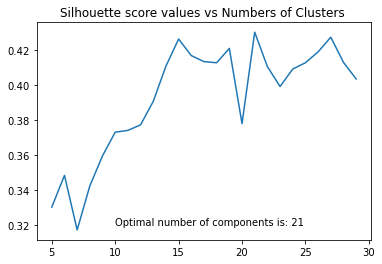

Optimal number of components is: 21


In [260]:
# define a function to choose the optimum k
def plot_kmeans(data):
    plot_data = data.copy()
    silhouette_score_values = []
    number_of_clusters = range(5, 30)
    for i in number_of_clusters:
        classifier = KMeans(i, init='k-means++', n_init=10,
                            max_iter=300, tol=0.0001, random_state=10)
        classifier.fit(plot_data)
        labels = classifier.predict(plot_data)
        silhouette_score_values.append(silhouette_score(
            plot_data, labels, metric='euclidean', random_state=10))

    optium_k = number_of_clusters[silhouette_score_values.index(
        max(silhouette_score_values))]
    plt.plot(number_of_clusters, silhouette_score_values)
    plt.text(10, plt.yticks()[0][1], f"Optimal number of components is: {optium_k}")
    plt.title("Silhouette score values vs Numbers of Clusters ")
    plt.savefig("Silhouette_score")
    # print()
    plt.show()
    print(f"Optimal number of components is: {optium_k}")
    return optium_k


# prepare data for K_clusters
venue_for_cluster_preferred = venue_grouped_preferred.copy()

# combine all the suburbs even with no available data collected
venue_for_cluster_preferred = cbr_merged[["suburb"]].merge(venue_for_cluster_preferred, how="left", on="suburb")
venue_for_cluster_preferred = venue_for_cluster_preferred.fillna(0)

# choose the optimal numbe of k
map_preferred_cluster = venue_for_cluster_preferred.drop(['suburb'], 1)
k_preferred = plot_kmeans(map_preferred_cluster)

In [261]:
#step 1 choose the optimal k
kclusters = k_preferred
#Step 2: Run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(map_preferred_cluster)
#Step 3: Insert cluster into dataframe
cbr_merged["preferred_cluster"]  = pd.DataFrame(kmeans.labels_)
cbr_merged.head()

,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score,avg_price,price_range,color,Numbe Of Venues Type,preferred_cluster
0,Acton,Canberra Central,"2,086",0,2601,1928,-35.2794,149.1194,"https://en.wikipedia.org/wiki/Acton,_Australia...",0.0013,0.0000,0,gray,5,0
1,Ainslie,Canberra Central,"5,189","1,483",2602,1928,-35.2628,149.1442,"https://en.wikipedia.org/wiki/Ainslie,_Austral...",0.0020,"1,417,281.2500","(1280887.5, 4375000.0]",purple,5,8
2,Braddon,Canberra Central,"5,500","3,930",2612,1922,-35.2719,149.1356,"https://en.wikipedia.org/wiki/Braddon,_Austral...",0.0005,0.0000,0,gray,7,0
3,Campbell,Canberra Central,"4,997",781,2612,1928,-35.2881,149.1539,"https://en.wikipedia.org/wiki/Campbell,_Austra...",0.0043,"2,030,000.0000","(1280887.5, 4375000.0]",purple,6,8
4,City,Canberra Central,"4,276","2,850",2601,1927,-35.2820,149.1286,"https://en.wikipedia.org/wiki/City,_Australian...",0.0000,0.0000,0,gray,8,0


In [262]:
#Update Geojson data
geo = Geojson_modified()
geo_map_cbr = geo.geojson_modified(cbr_merged)
print(len(geo_map_cbr["features"]))
geo_map_cbr["features"][0]["properties"]

try
120


{'ID': 644,
 'DIVISION_CODE': 911,
 'DIVISION_NAME': 'COOMBS',
 'LAST_UPDATE_DATE': '2011-09-19T08:51:25Z',
 'OBJECTID': 1,
 'suburb': 'Coombs',
 'district': 'Molonglo Valley',
 'population': '1,811',
 'density/km': '787',
 'postcode': '2611',
 'established': '0',
 'latitude': -35.3189083,
 'longitude': 149.0448194,
 'suburb_url': 'https://en.wikipedia.org/wiki/Coombs,_Australian_Capital_Territory',
 'safety_score': 0.006542049951516106,
 'avg_price': 985361.0,
 'price_range': '(890584.5, 1000397.917]',
 'color': 'orange',
 'Numbe Of Venues Type': 2,
 'preferred_cluster': 5.0}

In [310]:
housePrice_map = folium.Map(location=[-35.3,149.1], zoom_start=11, tiles="cartodbpositron")

step = bcm.linear.Set1_09.scale(0, k_preferred-1).to_step(k_preferred)
step.caption = "cluster"
step.add_to(housePrice_map)

folium.GeoJson(
    geo_map_cbr,
    style_function=lambda feature: {
        "fillColor": step(feature["properties"]["preferred_cluster"]),
        "color": "black",
        "weight": 2,
        "dashArray": "5, 5",
    },
    zoom_on_click=True,
    name="Average Price"
).add_to(housePrice_map)

folium.GeoJson(
    ACT_District_Boundaries,
    style_function=lambda feature: {
        "fillColor": "gray",
        "color": "black",
        "weight": 2,
        "dashArray": "5, 5",
    },
    zoom_on_click=True,
    name="Average Price"
).add_to(housePrice_map)



home_popup = "Sandy Home\n Dickson, ACT 2602"
home = folium.Marker(
            location=[home_latlon[0], home_latlon[1]],
            popup=home_popup, 
            tooltip="Sandy Home",
            icon=folium.Icon(icon="home",color="red"),
            name="home"
            ).add_to(housePrice_map)

work_popup = "Sandy workplace\n Civic, ACT 2601"
work = folium.Marker(
            location=[work_latlon[0], work_latlon[1]],
            popup=work_popup, 
            tooltip="Sandy Work",
            icon=folium.Icon(icon="usd",color="red"),
            name="work"
            ).add_to(housePrice_map)

folium.LayerControl(collapsed=False).add_to(housePrice_map)
housePrice_map.save("Map.html")
housePrice_map

In [264]:
#Create Folium Map
map_preferred= folium.Map(location=home_latlon, zoom_start=11)

#Set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

#Add markers to the map
markers_colors = []
for lat, lon, poi, cluster, avg_price in zip(cbr_merged['latitude'], cbr_merged['longitude'], cbr_merged['suburb'], cbr_merged['preferred_cluster'], cbr_merged['avg_price']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster) + ' Avg_Price ' +str(avg_price), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=0.7).add_to(map_preferred)

#Add icon indicating Johns home
text = 'Johns home'

iframe = folium.IFrame(text, width=700, height=450)
popup = folium.Popup(iframe, max_width=1000)

map_preferred.add_child(folium.Marker(location=home_latlon, popup=popup,
                     icon=folium.Icon(color='red')))   
       
map_preferred

In [265]:
# find cluster of dickson
clsuter_dickson_preferred = cbr_merged[cbr_merged.suburb=='Dickson'].preferred_cluster.values[0]
print(f"The cluster of Dickson is: {clsuter_dickson_preferred}")
cbr_merged.groupby("preferred_cluster").count()["suburb"]

The cluster of Dickson is: 0


preferred_cluster
0     20
1      5
2      6
3     16
4      5
5      3
6      3
7      5
8     11
9      4
10     9
11     2
12     3
13     7
14     9
15     2
16     1
17     6
18     6
19     1
20     2
Name: suburb, dtype: int64

In [266]:
similarSurburbs_prefer = cbr_merged[cbr_merged['preferred_cluster']==clsuter_dickson_preferred].sort_values("avg_price", ascending = False)
similarSurburbs_prefer = similarSurburbs_prefer[similarSurburbs_prefer["avg_price"] !=0]
similarSurburbs_prefer.reset_index(drop=True, inplace = True)
print("We identified {} different areas that are similar to Sandy's current home".format(similarSurburbs_prefer[similarSurburbs_prefer['preferred_cluster']==clsuter_dickson_preferred].shape[0]))
similarSurburbs_prefer

We identified 16 different areas that are similar to Sandy's current home


,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score,avg_price,price_range,color,Numbe Of Venues Type,preferred_cluster
0,Forrest,Canberra Central,"1,615",759,2603,1926,-35.3181,149.1250,"https://en.wikipedia.org/wiki/Forrest,_Austral...",0.0082,"2,870,000.0000","(1280887.5, 4375000.0]",purple,6,0
1,Griffith,Canberra Central,"4,575","1,664",2603,1927,-35.3247,149.1372,"https://en.wikipedia.org/wiki/Griffith,_Austra...",0.0011,"2,303,333.3333","(1280887.5, 4375000.0]",purple,6,0
2,Turner,Canberra Central,"4,047","2,700",2612,1928,-35.2686,149.1242,"https://en.wikipedia.org/wiki/Turner,_Australi...",0.0027,"1,658,125.0000","(1280887.5, 4375000.0]",purple,7,0
3,Downer,Canberra Central,"3,662","2,290",2602,1960,-35.2442,149.1450,"https://en.wikipedia.org/wiki/Downer,_Australi...",0.0065,"1,194,178.4000","(1147433.333, 1280887.5]",darkred,4,0
4,Kingston,Canberra Central,"4,424","3,377",2604,1922,-35.3156,149.1442,"https://en.wikipedia.org/wiki/Kingston,_Austra...",0.0014,"1,180,000.0000","(1147433.333, 1280887.5]",darkred,7,0
5,Lyons,Woden Valley,"3,085","1,341",2606,1965,-35.3420,149.0760,"https://en.wikipedia.org/wiki/Lyons,_Australia...",0.0043,"1,154,250.0000","(1147433.333, 1280887.5]",darkred,5,0
6,Lyneham,Canberra Central,"5,112",929,2602,1928,-35.2500,149.1292,"https://en.wikipedia.org/wiki/Lyneham,_Austral...",0.0008,"1,146,333.3333","(1000397.917, 1147433.333]",red,6,0
7,Dickson,Canberra Central,"2,149","1,340",2602,1928,-35.2525,149.1397,"https://en.wikipedia.org/wiki/Dickson,_Austral...",0.0009,"1,051,250.0000","(1000397.917, 1147433.333]",red,6,0
8,Chifley,Woden Valley,"2,407","1,500",2606,1966,-35.3511,149.0778,"https://en.wikipedia.org/wiki/Chifley,_Austral...",0.0072,"1,027,562.5000","(1000397.917, 1147433.333]",red,5,0
9,Weston,Weston Creek,"3,576","1,154",2611,1970,-35.3380,149.0590,"https://en.wikipedia.org/wiki/Weston,_Australi...",0.0016,"967,833.3333","(890584.5, 1000397.917]",orange,6,0


For all venus cluster

In [298]:
venue_grouped_all = get_one_hot(all_venues_merged, dummyby="venue category")
venueRank_all = rank_venues(venue_grouped_all).rename(columns={"Numbe Of Venues Type": "Numbe Of Venues Type ALL"})
# venueRank_all = venueRank_all.rename(columns={"Numbe Of Venues Type": "Numbe Of Venues Type ALL"})
# see the score of Dickson
dickson_rank_all = venueRank_all[venueRank_all.suburb=="Dickson"]
print(f"Among of all suburbs Dickson ranked at {dickson_rank_all.index.values[0]} with the score of {dickson_rank_all['Numbe Of Venues Type ALL'].values[0]}\nand there are {venueRank_all[venueRank_all['Numbe Of Venues Type ALL']>=32].shape[0]} suburbs have equal or higher score than Dickson")
dickson_rank_all

Among of all suburbs Dickson ranked at 11 with the score of 32
and there are 12 suburbs have equal or higher score than Dickson


,suburb,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,...,225th Most Common Venue,226th Most Common Venue,227th Most Common Venue,228th Most Common Venue,229th Most Common Venue,230th Most Common Venue,231th Most Common Venue,232th Most Common Venue,233th Most Common Venue,Numbe Of Venues Type ALL
11,Dickson,Vegetarian / Vegan Restaurant,Sports Club,Memorial Site,Mountain,Pharmacy,Malay Restaurant,Locksmith,Nature Preserve,Mexican Restaurant,...,None,None,None,None,None,None,None,None,None,32


In [287]:
venueRank_all_for_report = venueRank_all.head().append(dickson_rank_all)
venueRank_all_for_report

,suburb,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,...,225th Most Common Venue,226th Most Common Venue,227th Most Common Venue,228th Most Common Venue,229th Most Common Venue,230th Most Common Venue,231th Most Common Venue,232th Most Common Venue,233th Most Common Venue,Numbe Of Venues Type ALL
0,Braddon,Noodle House,Burger Joint,Fast Food Restaurant,Restaurant,Food & Drink Shop,Comic Shop,Ice Cream Shop,Pizza Place,Dry Cleaner,...,None,None,None,None,None,None,None,None,None,64
1,City,Burger Joint,Mexican Restaurant,Noodle House,Shopping Plaza,Department Store,Molecular Gastronomy Restaurant,Music Venue,Indian Restaurant,Gym,...,None,None,None,None,None,None,None,None,None,64
2,Belconnen,Thai Restaurant,Liquor Store,Paper / Office Supplies Store,Hardware Store,Market,Pub,Post Office,Bar,Middle Eastern Restaurant,...,None,None,None,None,None,None,None,None,None,50
3,Reid,Hotel,Sushi Restaurant,Noodle House,Sandwich Place,Plaza,Molecular Gastronomy Restaurant,Japanese Restaurant,Theme Park Ride / Attraction,Museum,...,None,None,None,None,None,None,None,None,None,46
4,Phillip,Steakhouse,College,Community Health Centres,General Practise,Ice Cream Shop,Bakery,Juice Bar,Italian Restaurant,Liquor Store,...,None,None,None,None,None,None,None,None,None,42
11,Dickson,Vegetarian / Vegan Restaurant,Sports Club,Memorial Site,Mountain,Pharmacy,Malay Restaurant,Locksmith,Nature Preserve,Mexican Restaurant,...,None,None,None,None,None,None,None,None,None,32


In [268]:
# update main data
cbr_merged = cbr_merged.merge(venueRank_all[["suburb", "Numbe Of Venues Type ALL"]], how="left", on="suburb")

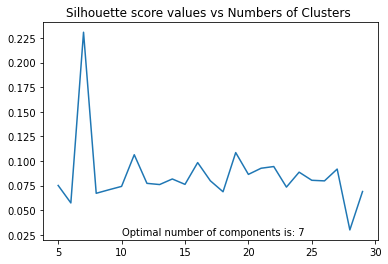

Optimal number of components is: 7


In [269]:
# prepare data for kclusters
venue_for_cluster_all = venue_grouped_all.copy()
venue_for_cluster_all = cbr_merged[["suburb"]].merge(venue_for_cluster_all, how="left", on="suburb")
venue_for_cluster_all = venue_for_cluster_all.fillna(0)

#select the optimal k
map_all_cluster = venue_for_cluster_all.drop(['suburb'], 1)
k_all = plot_kmeans(map_all_cluster)


In [270]:
kclusters = k_all
#Step 2: Run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(map_preferred_cluster)
#Step 3: Insert cluster into dataframe
cbr_merged["all_cluster"]  = pd.DataFrame(kmeans.labels_)
cbr_merged.head()

,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score,avg_price,price_range,color,Numbe Of Venues Type,preferred_cluster,Numbe Of Venues Type ALL,all_cluster
0,Acton,Canberra Central,"2,086",0,2601,1928,-35.2794,149.1194,"https://en.wikipedia.org/wiki/Acton,_Australia...",0.0013,0.0000,0,gray,5,0,40,1
1,Ainslie,Canberra Central,"5,189","1,483",2602,1928,-35.2628,149.1442,"https://en.wikipedia.org/wiki/Ainslie,_Austral...",0.0020,"1,417,281.2500","(1280887.5, 4375000.0]",purple,5,8,10,2
2,Braddon,Canberra Central,"5,500","3,930",2612,1922,-35.2719,149.1356,"https://en.wikipedia.org/wiki/Braddon,_Austral...",0.0005,0.0000,0,gray,7,0,64,1
3,Campbell,Canberra Central,"4,997",781,2612,1928,-35.2881,149.1539,"https://en.wikipedia.org/wiki/Campbell,_Austra...",0.0043,"2,030,000.0000","(1280887.5, 4375000.0]",purple,6,8,13,4
4,City,Canberra Central,"4,276","2,850",2601,1927,-35.2820,149.1286,"https://en.wikipedia.org/wiki/City,_Australian...",0.0000,0.0000,0,gray,8,0,64,1


In [271]:
#Create Folium Map
map_all = folium.Map(location=home_latlon, zoom_start=11)

#Set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

#Add markers to the map
markers_colors = []
for lat, lon, poi, cluster, avg_price in zip(cbr_merged['latitude'], cbr_merged['longitude'], cbr_merged['suburb'], cbr_merged['all_cluster'], cbr_merged['avg_price']):
    # label = folium.Popup(str(poi) + ' Cluster ' + str(cluster) + ' Avg_Price ' +str(avg_price), parse_html=True)
    tooltip = str(poi) + ' Cluster ' + str(cluster) + ' Avg_Price ' +str(avg_price)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        tooltip = tooltip,
        # popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=0.7).add_to(map_all)

#Add icon indicating Johns home
text = 'Sandy home'

# iframe = folium.IFrame(text, width=700, height=450)
# popup = folium.Popup(iframe, max_width=1000)

map_all.add_child(folium.Marker(location=home_latlon, tooltip=text,
                     icon=folium.Icon(color='red')))   
       
map_all

In [272]:
# find cluster of dickson
clsuter_dickson_all = cbr_merged[cbr_merged.suburb=='Dickson'].all_cluster.values[0]
print(f"The cluster of Dickson is: {clsuter_dickson_all}")
cbr_merged.groupby("all_cluster").count()["suburb"]

The cluster of Dickson is: 1


all_cluster
0    10
1    27
2    27
3    17
4    38
5     4
6     3
Name: suburb, dtype: int64

In [273]:
similarSurburbs_all = cbr_merged[cbr_merged['all_cluster']==clsuter_dickson_all].sort_values("avg_price", ascending = False)
similarSurburbs_all = similarSurburbs_all[similarSurburbs_all["avg_price"] !=0]
similarSurburbs_all.reset_index(drop=True, inplace = True)
print("We identified {} different areas that are similar to Johns current home".format(similarSurburbs_all[similarSurburbs_all['all_cluster']==clsuter_dickson_all].shape[0]))
similarSurburbs_all

We identified 23 different areas that are similar to Johns current home


,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score,avg_price,price_range,color,Numbe Of Venues Type,preferred_cluster,Numbe Of Venues Type ALL,all_cluster
0,Forrest,Canberra Central,"1,615",759,2603,1926,-35.3181,149.1250,"https://en.wikipedia.org/wiki/Forrest,_Austral...",0.0082,"2,870,000.0000","(1280887.5, 4375000.0]",purple,6,0,25,1
1,Griffith,Canberra Central,"4,575","1,664",2603,1927,-35.3247,149.1372,"https://en.wikipedia.org/wiki/Griffith,_Austra...",0.0011,"2,303,333.3333","(1280887.5, 4375000.0]",purple,6,0,38,1
2,Yarralumla,Canberra Central,"2,890",328.0,2600,1922,-35.3051,149.0981,"https://en.wikipedia.org/wiki/Yarralumla,_Aust...",0.0029,"1,996,000.0000","(1280887.5, 4375000.0]",purple,4,8,7,1
3,Turner,Canberra Central,"4,047","2,700",2612,1928,-35.2686,149.1242,"https://en.wikipedia.org/wiki/Turner,_Australi...",0.0027,"1,658,125.0000","(1280887.5, 4375000.0]",purple,7,0,40,1
4,Aranda,Belconnen,"2,393","1,500",2614,0,-35.2583,149.0800,"https://en.wikipedia.org/wiki/Aranda,_Australi...",0.0000,"1,315,700.0000","(1280887.5, 4375000.0]",purple,6,8,13,1
5,Isaacs,Woden Valley,"2,341",755,2607,1986,-35.3675,149.1114,"https://en.wikipedia.org/wiki/Isaacs,_Australi...",0.0112,"1,204,000.0000","(1147433.333, 1280887.5]",darkred,4,13,6,1
6,Hackett,Canberra Central,"2,991","1,570",2602,1960,-35.2481,149.1628,"https://en.wikipedia.org/wiki/Hackett,_Austral...",0.0081,"1,197,772.7273","(1147433.333, 1280887.5]",darkred,4,8,7,1
7,Downer,Canberra Central,"3,662","2,290",2602,1960,-35.2442,149.1450,"https://en.wikipedia.org/wiki/Downer,_Australi...",0.0065,"1,194,178.4000","(1147433.333, 1280887.5]",darkred,4,0,21,1
8,Kingston,Canberra Central,"4,424","3,377",2604,1922,-35.3156,149.1442,"https://en.wikipedia.org/wiki/Kingston,_Austra...",0.0014,"1,180,000.0000","(1147433.333, 1280887.5]",darkred,7,0,30,1
9,Lyons,Woden Valley,"3,085","1,341",2606,1965,-35.3420,149.0760,"https://en.wikipedia.org/wiki/Lyons,_Australia...",0.0043,"1,154,250.0000","(1147433.333, 1280887.5]",darkred,5,0,21,1


In [274]:
print(f"There are __{similarSurburbs_all.shape[0]}__ suburbs similar to Sandy's current home based on all the available venues, and __{ similarSurburbs_prefer.shape[0]}__ suburbs similar to Sandy's current home based on her faviate")

There are __23__ suburbs similar to Sandy's current home based on all the available venues, and __16__ suburbs similar to Sandy's current home based on her faviate


In [275]:
similarSurburbs = cbr_merged[
            (cbr_merged["preferred_cluster"]==clsuter_dickson_preferred)\
          & (cbr_merged["all_cluster"]==clsuter_dickson_all)\
          & (cbr_merged["avg_price"]!=0)
].reset_index(drop=True)
print("We identified {} different areas that are similar to Sandy current home".format(similarSurburbs.shape[0]))
similarSurburbs

We identified 16 different areas that are similar to Sandy current home


,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score,avg_price,price_range,color,Numbe Of Venues Type,preferred_cluster,Numbe Of Venues Type ALL,all_cluster
0,Dickson,Canberra Central,"2,149","1,340",2602,1928,-35.2525,149.1397,"https://en.wikipedia.org/wiki/Dickson,_Austral...",0.0009,"1,051,250.0000","(1000397.917, 1147433.333]",red,6,0,32,1
1,Downer,Canberra Central,"3,662","2,290",2602,1960,-35.2442,149.1450,"https://en.wikipedia.org/wiki/Downer,_Australi...",0.0065,"1,194,178.4000","(1147433.333, 1280887.5]",darkred,4,0,21,1
2,Lyneham,Canberra Central,"5,112",929,2602,1928,-35.2500,149.1292,"https://en.wikipedia.org/wiki/Lyneham,_Austral...",0.0008,"1,146,333.3333","(1000397.917, 1147433.333]",red,6,0,33,1
3,Turner,Canberra Central,"4,047","2,700",2612,1928,-35.2686,149.1242,"https://en.wikipedia.org/wiki/Turner,_Australi...",0.0027,"1,658,125.0000","(1280887.5, 4375000.0]",purple,7,0,40,1
4,Forrest,Canberra Central,"1,615",759,2603,1926,-35.3181,149.1250,"https://en.wikipedia.org/wiki/Forrest,_Austral...",0.0082,"2,870,000.0000","(1280887.5, 4375000.0]",purple,6,0,25,1
5,Griffith,Canberra Central,"4,575","1,664",2603,1927,-35.3247,149.1372,"https://en.wikipedia.org/wiki/Griffith,_Austra...",0.0011,"2,303,333.3333","(1280887.5, 4375000.0]",purple,6,0,38,1
6,Kingston,Canberra Central,"4,424","3,377",2604,1922,-35.3156,149.1442,"https://en.wikipedia.org/wiki/Kingston,_Austra...",0.0014,"1,180,000.0000","(1147433.333, 1280887.5]",darkred,7,0,30,1
7,Belconnen,Belconnen,"6,657","1,513",2617,1983,-35.2370,149.0650,"https://en.wikipedia.org/wiki/Belconnen,_Austr...",0.0000,"620,000.0000","(376999.999, 715834.856]",lightblue,9,0,50,1
8,Bruce,Belconnen,"6,997","1,206",2617,1968,-35.2420,149.0770,"https://en.wikipedia.org/wiki/Bruce,_Australia...",0.0006,"899,000.0000","(890584.5, 1000397.917]",orange,6,0,19,1
9,Gungahlin,Gungahlin,"6,134","1,333",2912,1998,-35.1833,149.1318,"https://en.wikipedia.org/wiki/Gungahlin,_Austr...",0.0004,"851,623.8571","(830298.661, 890584.5]",yellow,9,0,30,1


In [276]:
# use Dickson as a reference to filter the suburbs have similar performance in the venue numbers with lower safety_score and lower avg_price
reference_row = similarSurburbs[similarSurburbs.suburb=="Dickson"]
print("Average House price of Dickson is: $ {:,.2f}".format(reference_row.avg_price.values[0]))
print("Number of Preferred venue types in Dickson:  {:2.0f}".format(reference_row["Numbe Of Venues Type"].values[0]))
print("Number of all venue types in Dickson:  {:2.0f}".format(reference_row["Numbe Of Venues Type ALL"].values[0]))
print("{:.5f}".format(reference_row.safety_score.values[0]))
reference_row

Average House price of Dickson is: $ 1,051,250.00
Number of Preferred venue types in Dickson:   6
Number of all venue types in Dickson:  32
0.00089


,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score,avg_price,price_range,color,Numbe Of Venues Type,preferred_cluster,Numbe Of Venues Type ALL,all_cluster
0,Dickson,Canberra Central,"2,149","1,340",2602,1928,-35.2525,149.1397,"https://en.wikipedia.org/wiki/Dickson,_Austral...",0.0009,"1,051,250.0000","(1000397.917, 1147433.333]",red,6,0,32,1


In [277]:
# Take Sandy's Budget into consideration by adjust the price to 1.5 times of dickson average house price
best_choice = similarSurburbs[(similarSurburbs.avg_price <= reference_row.avg_price.values[0]*1.5)\
    &(similarSurburbs.safety_score<=reference_row.safety_score.values[0])\
    &(similarSurburbs["Numbe Of Venues Type"]>= reference_row["Numbe Of Venues Type"].values[0])\
    &(similarSurburbs["Numbe Of Venues Type ALL"]>= reference_row["Numbe Of Venues Type ALL"].values[0])   
        ].reset_index(drop=True)
best_choice

,suburb,district,population,density/km,postcode,established,latitude,longitude,suburb_url,safety_score,avg_price,price_range,color,Numbe Of Venues Type,preferred_cluster,Numbe Of Venues Type ALL,all_cluster
0,Dickson,Canberra Central,"2,149","1,340",2602,1928,-35.2525,149.1397,"https://en.wikipedia.org/wiki/Dickson,_Austral...",0.0009,"1,051,250.0000","(1000397.917, 1147433.333]",red,6,0,32,1
1,Lyneham,Canberra Central,"5,112",929,2602,1928,-35.2500,149.1292,"https://en.wikipedia.org/wiki/Lyneham,_Austral...",0.0008,"1,146,333.3333","(1000397.917, 1147433.333]",red,6,0,33,1
2,Belconnen,Belconnen,"6,657","1,513",2617,1983,-35.2370,149.0650,"https://en.wikipedia.org/wiki/Belconnen,_Austr...",0.0000,"620,000.0000","(376999.999, 715834.856]",lightblue,9,0,50,1
3,Greenway,Tuggeranong,"1,894",357,2900,1988,-35.4180,149.0700,"https://en.wikipedia.org/wiki/Greenway,_Austra...",0.0004,"651,000.0000","(376999.999, 715834.856]",lightblue,8,0,34,1
4,Phillip,Woden Valley,"2,936","1,129",2606,1966,-35.3494,149.0903,"https://en.wikipedia.org/wiki/Phillip,_Austral...",0.0003,"377,000.0000","(376999.999, 715834.856]",lightblue,9,0,42,1


In [278]:
table_for_report = best_choice[["suburb","district","population","density/km","avg_price","safety_score","Numbe Of Venues Type", "Numbe Of Venues Type ALL"]]
table_for_report

,suburb,district,population,density/km,avg_price,safety_score,Numbe Of Venues Type,Numbe Of Venues Type ALL
0,Dickson,Canberra Central,"2,149","1,340","1,051,250.0000",0.0009,6,32
1,Lyneham,Canberra Central,"5,112",929,"1,146,333.3333",0.0008,6,33
2,Belconnen,Belconnen,"6,657","1,513","620,000.0000",0.0000,9,50
3,Greenway,Tuggeranong,"1,894",357,"651,000.0000",0.0004,8,34
4,Phillip,Woden Valley,"2,936","1,129","377,000.0000",0.0003,9,42


As the neighborhoods: __Lyneham__, __Dickson__, __Belconnen__ , __Greenway__, __Phillip__are the overall best choice for Sandy. 

In [279]:
#Update Geojson data for best choices
geo = Geojson_modified()
geo_map_best_choice = geo.geojson_modified(best_choice, savename="geo_map_best_choice.json")

#Update Geojson data for all
geo_map_cbr = geo.geojson_modified(cbr_merged)


try
try


In [280]:
# frame = folium.Figure(width=1050, height=750)

map_ = folium.Map(location=[-35.5,149], zoom_start=8)

folium.GeoJson(
    geo_map_cbr,
    style_function=lambda feature: {
        "fillColor": feature["properties"]["color"],
        "color": "black",
        "weight": 2,
        "dashArray": "5, 5",
    },
    zoom_on_click=True,
).add_to(map_)

folium.GeoJson(
    ACT_District_Boundaries,
    style_function = lambda feature: {
            'fillColor': "white", 
            'color': "black", 
            "weight": 2,
            'weight': 0.1},
    zoom_on_click=True,
).add_to(map_)


style_function = lambda x: {'fillColor': x["properties"]["color"], 
                            'color': x["properties"]["color"], 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': x["properties"]["color"], 
                                'color':x["properties"]["color"], 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

for i in range(len(geo_map_cbr["features"])):
    row = geo_map_cbr["features"][i]
    if row["properties"]:
        feature = folium.features.GeoJson(
        row,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(
            fields=[
                "suburb",
                'district',
                "population",
                'density/km',
                'postcode',
                'avg_price',
                'safety_score',
                'color',
                'Numbe Of Venues Type',
                'Numbe Of Venues Type ALL'
            ],
            aliases=[
                "Suburb :",
                'District :',
                'Population :',
                'Density/km :',
                'Postcode :',
                'Average Price :',
                'Safety Index :',
                'Color :',
                'Numbe Of Venues Type :',
                'Numbe Of Venues Type ALL :'
            ],
            style=("color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
            )
        )
        map_.add_child(feature)
        map_.keep_in_front(feature)


for i in range(len(ACT_District_Boundaries["features"])):
    row = ACT_District_Boundaries["features"][i]
    if row["properties"]:
        feature = folium.features.GeoJson(
        row,
        control=False,
        highlight_function = lambda feature: {
        'fillColor': "lightblue", 
        'color':"lightblue", 
        'fillOpacity': 0.50, 
        'weight': 0.1},
        style_function = lambda x: {
            'fillColor': "white", 
            'color': "white", 
            'fillOpacity': 0.1, 
            'weight': 0.1},
        tooltip=folium.features.GeoJsonTooltip(
            fields=[
                "DISTRICT_NAME"
            ],
            aliases=[
                "District:",
            ],
            # style=("color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
            )
        )
        map_.add_child(feature)
        # map_.keep_in_front(feature)


home_popup = "Sandy Home\n Dickson, ACT 2602"
home = folium.Marker(
            location=[home_latlon[0], home_latlon[1]],
            popup=home_popup, 
            tooltip="Sandy Home",
            icon=folium.Icon(icon="home",color="red"),
            name="home"
            ).add_to(map_)

work_popup = "Sandy workplace\n Civic, ACT 2601"
work = folium.Marker(
            location=[work_latlon[0], work_latlon[1]],
            popup=work_popup, 
            tooltip="Sandy Home",
            icon=folium.Icon(icon="usd",color="red"),
            name="work"
            ).add_to(map_)

map_

In [284]:
cbr_multi_layer_map = folium.Map(location=[-35.5,149],
                                zoom_start = 12, tiles='cartodbpositron')

fields=["suburb",'district',"population",'density/km','postcode','avg_price','safety_score','color','Numbe Of Venues Type','Numbe Of Venues Type ALL']
aliases=["Suburb :",'District :','Population :','Density/km :','Postcode :','Average Price :','Safety Index :','Color :','Numbe Of Venues Type :','Numbe Of Venues Type ALL :']
stepcolor_prefer = bcm.linear.YlOrRd_06.to_step(k_preferred).scale(0, k_preferred-1)
stepcolor_all = bcm.linear.YlOrRd_06.to_step(k_all).scale(0, k_all-1)
# Add main data into map
main_map = folium.GeoJson(
    geo_map_cbr,
    name="Main Map",
    style_function= lambda feature: {
    'fillColor': feature["properties"]["color"],
    'color': 'black',
    'weight': 1,
    "dashArray": "5, 5",
    'fillOpacity': 0.5,
    },
    highlight_function = lambda feature: {
        'fillColor': feature["properties"]["color"], 
        'color': feature["properties"]["color"], 
        'fillOpacity': 0.7, 
        'weight': 0.1
        },
    tooltip=folium.GeoJsonTooltip(
            fields=fields,
            aliases=aliases,
        localize=True
    )
).add_to(cbr_multi_layer_map)

# Add district boundaries into map
district_boundary = folium.GeoJson(
    ACT_District_Boundaries,
    name="District Layer",
    style_function = lambda feature: {
            'fillColor': "gray",
            'fillOpacity': 0.5, 
            'color': "black", 
            "weight": 2,
            'weight': 0.1},
    highlight_function = lambda feature: {
        'fillColor': "gray", 
        'color': "black", 
        'fillOpacity': 0.7, 
        'weight': 0.1
        },
    tooltip=folium.GeoJsonTooltip(
        fields=['DISTRICT_NAME'],
        aliases=['District :'],
        localize=True
    )
).add_to(cbr_multi_layer_map)

markers_control = folium.FeatureGroup(name='Sandy Home and Work location')
marker_cluster = MarkerCluster().add_to(markers_control)
cbr_multi_layer_map.add_child(markers_control)

home_location = folium.Marker(
            location=[home_latlon[0], home_latlon[1]],
            popup= "Sandy Home\n Dickson, ACT 2602", 
            tooltip="Sandy Home",
            icon=folium.Icon(icon="home",color="red"),
            name="Sandy Current Home"
            ).add_to(marker_cluster)

work_location = folium.Marker(
            location=[work_latlon[0], work_latlon[1]],
            popup="Sandy workplace\n Civic, ACT 2601", 
            tooltip="Sandy Work",
            icon=folium.Icon(icon="usd",color="red"),
            name="Sandy Work Place",
            ).add_to(marker_cluster)


# Add best choices into map
best_choices = folium.GeoJson(
    geo_map_best_choice,
    show=False,
    name="The optimal suburbs for Sandy",
    style_function = lambda feature: {
            'fillColor': feature["properties"]["color"],
            'fillOpacity': 0.5, 
            'color': "black", 
            "weight": 2,
            'weight': 0.1},
    highlight_function = lambda feature: {
        'fillColor': "blue", 
        'color': "black", 
        'fillOpacity': 0.7, 
        'weight': 0.1
        },
    tooltip=folium.GeoJsonTooltip(
            fields=fields,
            aliases=aliases,
        localize=True
    )
).add_to(cbr_multi_layer_map)

preferred_cluster = folium.GeoJson(
    geo_map_cbr,
    show=False,
    name="Cluster based on sandy preference",
    style_function = lambda feature: {
            'fillColor': stepcolor_prefer(feature["properties"]["preferred_cluster"]),
            'fillOpacity': 0.6, 
            'color': "black", 
            "weight": 2,
            'weight': 0.1},
    highlight_function = lambda feature: {
        'fillColor': stepcolor_prefer(feature["properties"]["preferred_cluster"]), 
        'color': "black", 
        'fillOpacity': 0.8, 
        'weight': 0.1
        },
    tooltip=folium.GeoJsonTooltip(
            fields=fields,
            aliases=aliases,
        localize=True
    )
).add_to(cbr_multi_layer_map)

all_cluster = folium.GeoJson(
    geo_map_cbr,
    show=False,
    name="Cluster based on all venues",
    style_function = lambda feature: {
            'fillColor': stepcolor_all(feature["properties"]["all_cluster"]),
            'fillOpacity': 0.6, 
            'color': "black", 
            "weight": 2,
            'weight': 0.1},
    highlight_function = lambda feature: {
        'fillColor': stepcolor_all(feature["properties"]["all_cluster"]), 
        'color': "black", 
        'fillOpacity': 0.8, 
        'weight': 0.1
        },
    tooltip=folium.GeoJsonTooltip(
            fields=fields,
            aliases=aliases,
            localize=True
    )
).add_to(cbr_multi_layer_map)




folium.map.CustomPane('labels').add_to(cbr_multi_layer_map)
folium.TileLayer('CartoDBPositronOnlyLabels', pane='labels').add_to(cbr_multi_layer_map)
cbr_multi_layer_map.keep_in_front(main_map)
cbr_multi_layer_map.keep_in_front(preferred_cluster)
cbr_multi_layer_map.keep_in_front(all_cluster)

with open("template_final.html", "r") as file:
    template_final = file.read()
macro = MacroElement()
macro._template = Template(template_final)
cbr_multi_layer_map.get_root().add_child(macro)

folium.LayerControl(collapsed=False).add_to(cbr_multi_layer_map)
cbr_multi_layer_map.save("cbr_multi_layer_map.html")
cbr_multi_layer_map


# 5. Results and Discussion
Different analysis have been performed to find the suburbs for sandy. Based on the assumptions: 1)the suburb should within the same group as Dickson in both preferred venues and all venues method; 2)the suburb should have equal or higher venue types as Dickson in both preferred venues and all venues method; 3)the average house price should lower than her budget which is 1.5 million. The suitable suburbs have been narrowed down to only 5 suburbs: Dickson, Lyneham, Belconnen, Greenway and Phillip.

# 6. Limitations
For simplified purpose, the data scrapped from the website have not been validated. And there are some assumptions made in this project which may not fit for all situations.

# 7. Conclusion
Choosing a suitable suburb to purchase a dream house is a challenging task, so the help from the data analysis can make this decision more educated and visualized. Similarly, data analysis can also be used to solve many other real-life problems.